# Algoritmos para MDP
## Value Iteration and Policy Iteration

### Definindo o ambiente:

S -> conjunto de estados

A -> conjunto de ações

s -> estado

a -> ação

t -> probabilidade de transição

r -> recompensa

s_next -> próximo estado

P -> mapa para um dado estado "s" e uma ação "a" retorna a lista de "s_next", "t" e "r"

### Função de Iteração de valor

action_value -> função que calcula todos os valores para cada ação dado um determinado s

In [1]:
import numpy as np

def value_iteration(S, A, P, n=10, gamma=1, epsilon=1e-8):
    V = np.zeros(len(S))
    policy = np.zeros(len(S))
    i=0
    updates=0
    for i in range(n):
        prev_V = np.copy(V)
        for s in S:
            q, q_updates = action_value(A, P, V, s, gamma)
            V[s] = max(q)
            policy[s] = np.argmax(q)
            updates += q_updates
            
        if np.max(np.fabs(prev_V - V)) < epsilon:
            break
    print('steps', i)
    print('updates', updates)
    return policy, V, i, updates

def action_value(A, P, V, s, gamma=1):
    q = np.zeros(len(A))
    q_updates = 0
    for a in A:
        for s_next, t, r  in P[(s, a)]:
            q_updates +=1
            q[a] += t * (r + gamma * V[s_next])
    
    return q, q_updates

### Função de Iteração de política


In [2]:
import copy

def policy_evaluation(policy, V, S, P, gamma=1, epsilon=1e-8):
    i=0
    while True:
        delta = 0
        i+=1
        updates = 0
        prev_V = np.copy(V)
        for s in S:
            V[s] = 0
            for s_next, t, r  in P[(s, policy[s])]:
                    V[s] += t * (r + gamma * prev_V[s_next])
                    updates += 1
        if np.max(np.fabs(prev_V - V)) < epsilon:
            break
    return V, updates


def policy_improvement(S, A, P, V, gamma=1):
    policy = np.zeros(len(S))
    updates = 0
    for s in S:   
        q, q_updates = action_value(A, P, V, s, gamma)
        policy[s] = np.argmax(q)
        updates += q_updates
    return policy, updates

def policy_iteration(S, A, P, n=10, gamma=1, epsilon=1e-8):
    policy = np.zeros(len(S))
    V = np.zeros(len(S))
    q_updates = 0
    ev_updates = 0
    for i in range(n):
        
        #policy evaluation
        V, updates = policy_evaluation(policy, V, S, P, gamma, epsilon)
        ev_updates += updates
        
        #policy improvement
        policy_prime, updates = policy_improvement(S, A, P, V, gamma)
        q_updates += updates
        
        if (policy == policy_prime).all():
            break;
            
        policy = copy.copy(policy_prime)
    print("steps",i)
    print("q_updates", q_updates)
    print("ev_updates", ev_updates)
    print("updates", q_updates + ev_updates)
        
    return policy, V, i , q_updates + ev_updates

### Função Prioritized Sweeping

In [3]:
import heapq

def prioritized_sweeping(S, A, P, gamma=1, epsilon=1e-8):
    P_QUEUE = []  # priority queue of states
    STATE2PRIORITY = {}  # map from a state to its priority
    HISTORY = []  # Array of value functions V over time
    
    updates = 0;
    policy = np.zeros(len(S))
    V = np.zeros(len(S))
    # first iteration, we don't have anything in our priority queue, add states that will change in the next sweep:
    for s in S:
        newV = np.copy(V) # don't update V yet, this is just a simulation to decide what to add in P_QUEUE
        q, q_updates = action_value(A, P, V, s, gamma)
        updates += q_updates
        fake_Vs = max(q)# update fake value function
        delta = abs(fake_Vs - V[s])
        # add states that will change a lot V in the real sweep:
        if delta > 0:
            heapq.heappush(P_QUEUE, (-delta, s))  # add s with priority -delta (most probable = lower value).
            STATE2PRIORITY[s] = -delta  # keep track of its priority.

    # Iterate over states in the priority queue:
    iteration = 1  # iteration index
    while len(P_QUEUE) > 0:
        HISTORY.append(np.copy(V))  # add deep copy of current Value Function to the history
        _, s = heapq.heappop(P_QUEUE)  # pop most probable state.
        del STATE2PRIORITY[s]  # forget its priority.

        # do one Bellman Backup of current state:
        prev_Vs = V[s]  # old state-value
        q, q_updates = action_value(A, P, V, s, gamma)
        updates += q_updates
        V[s] = max(q)# update value function
        policy[s] = np.argmax(q)
        delta = abs(prev_Vs-V[s])

        # add neighbors to the priority queue:
        for s1 in neighbors(s, A, P):
            priorities = []
            for a in A:
                priorities.append(max([delta * t for s_next, t, r  in P[(s, a)]]))
            new_priority = - max(priorities)  # how much s1 is influenced by the current change.
            if new_priority < 0:
                # most probable = min value between current and new priority.
                if s1 in STATE2PRIORITY and STATE2PRIORITY[s1] > new_priority:  # update element in priority queue
                    old_priority = STATE2PRIORITY[s1]
                    index = P_QUEUE.index((old_priority, s1))  # current index in the priority queue.
                    P_QUEUE[index] = (new_priority, s1)  # update current priority.
                    STATE2PRIORITY[s1] = new_priority  # keep track of the update.
                elif s1 not in STATE2PRIORITY:  # add new state to priority queue
                    heapq.heappush(P_QUEUE, (new_priority, s1))  # push to priority queue.
                    STATE2PRIORITY[s1] = new_priority  # keep track of its priority.
        iteration += 1
    print("steps",iteration)
    print("updates", updates)
    return policy, V, iteration, updates

def neighbors(s, A, P):
    n = []
    for a in A:
        for s_next, t, r  in P[(s, a)]:
            if s != s_next and s_next not in n:
                n.append(s_next)
    return n

### Função LRTDP


In [4]:
import random

class Stack:
    def __init__(self):
        self._a = []

    def push(self, item):
        self._a.append(item)

    def pop(self):
        return self._a.pop()

    def isEmpty(self):
        return len(self._a) == 0

    def __iter__(self):
        return reversed(self._a)

    def __str__(self):
        return str(list(iter(self)))

def lrtdp(s0, S, A, P, gamma=1, epsilon=1e-8):
    policy = np.zeros(len(S))
    V = np.zeros(len(S))
    updates = 0
    solved = []
    while s0 not in solved:
        q_updtaes = lrtdp_trial(s0, A, P, policy, V, solved, gamma, epsilon)
        updates += q_updtaes
        
    print('updates', updates)
    return policy, V, updates

def lrtdp_trial(s0, A, P, policy, V, solved, gamma=1, epsilon=1e-8):
    visited = Stack()
    prev_V = np.copy(V)
    s = s0
    updates = 0
    while s not in solved:
        if s not in visited:
            visited.push(s)
        if check_goal_state(s, A, P):
            break
        q, q_updates = action_value(A, P, V, s, gamma)
        updates += q_updates
        V[s] = max(q)
        policy[s] = np.argmax(q)
        
        s = stochastically_simulate_next_state(s, policy[s], P)

    while visited.isEmpty() == False:
        s = visited.pop()
        is_solved, q_updates = check_solved(s0, A, P, policy, V, prev_V, solved, gamma, epsilon)
        updates += q_updates
        if is_solved == False:
            break
            
    return updates

def check_goal_state(s, A, P):
    reward = 0
    for a in A:
        for s_next, t, r  in P[(s, a)]:
            reward+=r
    return (reward == 0)

def stochastically_simulate_next_state(s, a, P):
    random_number = random.uniform(0, 1)
    prob_sum = 0
    for s_next, t, r  in P[(s, a)]:
        prob_sum += t
        if(random_number <= prob_sum):
            return s_next
    return s_next
        

def check_solved(s0, A, P, policy, V, prev_V, solved, gamma=1, epsilon=1e-8):
    retVal = True
    open_S = Stack()
    closed_S = Stack()
    open_S.push(s0)
    updates = 0
    while open_S.isEmpty() == False:
        s = open_S.pop()
        if s not in closed_S:
            closed_S.push(s)
        if abs(prev_V[s] - V[s]) > epsilon:
            retVal = False
            continue
        q, q_updates = action_value(A, P, V, s, gamma)
        updates += q_updates
        a_best = np.argmax(q)
        for s_next, t, r  in P[(s, a_best)]:
            if s_next not in solved and s_next not in open_S and s_next not in closed_S:
                open_S.push(s_next)
    
    if retVal:
        while closed_S.isEmpty() == False:
            s = closed_S.pop()
            if(s not in solved):
                solved.append(s)
    else:
        while closed_S.isEmpty() == False:
            s = closed_S.pop()
            prev_V[s] = V[s]
            q, q_updates = action_value(A, P, V, s, gamma)
            updates += q_updates
            V[s] = max(q)
            policy[s] = np.argmax(q)
    return retVal, updates

### Cenário de teste

Ações cardinais (N,S,L,O). Na linha “Det.” as ações são deterministas. 
Na linha “Prob.” as ações resultam com 0.5 de chance, caso contrario o agente fica parado.
Custo de 1 por ação.

|   |   |   |   |   |   |
|---|---|---|---|---|---|
|Prob.| 7 | 6 | 4 | 2 | 0 |
|Det.| 5 | 4 | 3 | 2 | 1 |



In [5]:
#states
S = np.array(range(10))

#actions
A = np.array(range(4)) # North, South, East, West

#probabilities - (state,action)[(state_next, probability,reward),...]
P = {
    (0, 0): [(0, 1.0, -1)],
    (0, 1): [(5, 0.5, -1), (0, 0.5, -1)],
    (0, 2): [(1, 0.5, -1), (0, 0.5, -1)],
    (0, 3): [(0, 1.0, -1)],

    (1, 0): [(1, 1.0, -1)],
    (1, 1): [(6, 0.5, -1), (1, 0.5, -1)],
    (1, 2): [(2, 0.5, -1), (1, 0.5, -1)],
    (1, 3): [(0, 0.5, -1), (1, 0.5, -1)],

    (2, 0): [(2, 1.0, -1)],
    (2, 1): [(7, 0.5, -1), (2, 0.5, -1)],
    (2, 2): [(3, 0.5, -1), (2, 0.5, -1)],
    (2, 3): [(1, 0.5, -1), (2, 0.5, -1)],

    (3, 0): [(3, 1.0, -1)],
    (3, 1): [(8, 0.5, -1), (3, 0.5, -1)],
    (3, 2): [(4, 0.5, -1), (3, 0.5, -1)],
    (3, 3): [(2, 0.5, -1), (3, 0.5, -1)],

    (4, 0): [(4, 1.0, 0)],
    (4, 1): [(4, 1.0, 0)],
    (4, 2): [(4, 1.0, 0)],
    (4, 3): [(4, 1.0, 0)],

    (5, 0): [(0, 1.0, -1)],
    (5, 1): [(5, 1.0, -1)],
    (5, 2): [(6, 1.0, -1)],
    (5, 3): [(5, 1.0, -1)],

    (6, 0): [(1, 1.0, -1)],
    (6, 1): [(6, 1.0, -1)],
    (6, 2): [(7, 1.0, -1)],
    (6, 3): [(5, 1.0, -1)],

    (7, 0): [(2, 1.0, -1)],
    (7, 1): [(7, 1.0, -1)],
    (7, 2): [(8, 1.0, -1)],
    (7, 3): [(6, 1.0, -1)],

    (8, 0): [(3, 1.0, -1)],
    (8, 1): [(8, 1.0, -1)],
    (8, 2): [(9, 1.0, -1)],
    (8, 3): [(7, 1.0, -1)],

    (9, 0): [(4, 1.0, -1)],
    (9, 1): [(9, 1.0, -1)],
    (9, 2): [(9, 1.0, -1)],
    (9, 3): [(8, 1.0, -1)],
}

## Add time measure

In [6]:
import sys
!{sys.executable} -m pip install ipython-autotime

In [7]:
%load_ext autotime

### Teste da função de Iteração de valor

In [8]:
policy, V, steps, updates = value_iteration(S, A, P, 100, 0.9, 1e-8)

print("\n Value")
print(np.reshape(V, (2, 5)))

print("\n Policy")
print(np.reshape(policy, (2, 5)))

steps 31
updates 1632

 Value
[[-5.16871818 -4.52291509 -3.30578512 -1.81818182  0.        ]
 [-4.0951     -3.439      -2.71       -1.9        -1.        ]]

 Policy
[[1. 2. 2. 2. 0.]
 [2. 2. 2. 2. 0.]]
time: 14.4 ms


### Teste da função de Iteração de política

In [9]:
policy, V, steps, updates = policy_iteration(S, A, P, 100, 0.9, 1e-8)

print("\n Value")
print(np.reshape(V, (2, 5)))

print("\n Policy")
print(np.reshape(policy, (2, 5)))

steps 5
q_updates 306
ev_updates 74
updates 380

 Value
[[-5.16871819 -4.5229151  -3.30578512 -1.81818182  0.        ]
 [-4.0951     -3.439      -2.71       -1.9        -1.        ]]

 Policy
[[1. 2. 2. 2. 0.]
 [2. 2. 2. 2. 0.]]
time: 17.5 ms


### Teste da função Prioritized Sweeping

In [10]:
shape = (2, 5, 1)
policy, V, steps, updates = prioritized_sweeping(S, A, P, 0.9, 1e-8)

print("\n Value")
print(np.reshape(V, (2, 5)))

print("\n Policy")
print(np.reshape(policy, (2, 5)))

steps 459
updates 2551

 Value
[[-5.16871818 -4.5229151  -3.30578512 -1.81818182  0.        ]
 [-4.0951     -3.439      -2.71       -1.9        -1.        ]]

 Policy
[[1. 2. 2. 2. 0.]
 [2. 2. 2. 2. 0.]]
time: 31.7 ms


### Teste da função LRTDP

In [11]:
policy, V, updates = lrtdp(0, S, A, P, 0.9, 1e-8)

print("\n Value")
print(np.reshape(V, (2, 5)))

print("\n Policy")
print(np.reshape(policy, (2, 5)))

updates 889

 Value
[[-5.16871818 -4.18299918 -3.27615105 -1.81512452  0.        ]
 [-4.0951     -3.439      -2.71       -1.9        -1.        ]]

 Policy
[[1. 2. 2. 2. 0.]
 [2. 2. 2. 2. 0.]]
time: 7.53 ms


In [12]:
import matplotlib.pyplot as plt
%matplotlib inline

def draw_policy(S, V, policy, shape, font_size, plot_value = False):
    
    states_reshaped = np.reshape(S, shape)
    values_reshaped = np.reshape(V, shape)
    policy_reshaped = np.reshape(policy, shape)
    
    plt.figure(figsize=(10,10))
    h,w = shape
    states = sorted(S)
    plt.imshow(values_reshaped, cmap='gray')
    ax = plt.gca()
    ax.set_xticks(np.arange(w)-.5)
    ax.set_yticks(np.arange(h)-.5)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    Y, X = np.mgrid[0:4, 0:4]
    a2uv = {0.0: (0, 1), #north
            1.0: (0, -1),#south
            2.0: (1, 0), #east
            3.0: (-1, 0) #west
           }
    a2text = {4.0: 'D',#down
              5.0: 'U' #up
           }
    
    for y in range(h):
        for x in range(w):
            
            if plot_value:
                plt.text(x, y, round(values_reshaped[y,x], 2),
                         color='r', size=font_size/2,  verticalalignment='center',
                         horizontalalignment='center', fontweight='bold')
            else:
                if values_reshaped[y,x] == 0:
                    plt.text(x, y, 'G',
                         color='g', size=font_size,  verticalalignment='center',
                         horizontalalignment='center', fontweight='bold')
                else:
                    a = policy_reshaped[y, x]
                    if a is None: continue
                    if a in a2uv:
                        u, v = a2uv[a]
                        plt.arrow(x, y,u*.2, -v*.2, color='r', head_width=0.2, head_length=0.2) 
                    else:
                        t = a2text[a]
                        plt.text(x, y, t,
                         color='r', size=font_size,  verticalalignment='center',
                         horizontalalignment='center', fontweight='bold')
    plt.grid(color='b', lw=2, ls='-')
    plt.show()

time: 203 ms


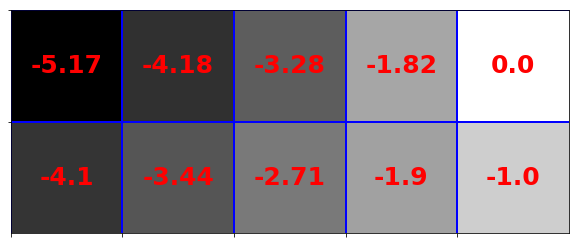

time: 107 ms


In [13]:
draw_policy(S, V, policy, (2,5), 50, True)

# Load data functions

In [14]:
import glob
import re
from numpy import genfromtxt

def loadFromDataPath(path):
    rewards_data = genfromtxt(path + 'Rewards.txt', delimiter='   ')
    action_files = glob.glob(path + 'Action*.txt')
    
    #states
    S = []
    #actions
    A = []
    #probabilities - (state,action)[(state_next, probability,reward),...]
    P = {}

    for action_file in action_files:
        m = re.search('Action(.+?).txt', action_file)
        if m:
            action = int(m.group(1))
            action_data = genfromtxt(action_file, delimiter='   ')
            
            putData(action, action_data, rewards_data, S, A, P)
    return np.fromiter(S, dtype=np.int), np.fromiter(A, dtype=np.int), P
            
def putData(a, action_data, rewards_data, S, A, P):
    a_index = int(a-1)
    if a_index not in A: A.append(a_index)
    for s, s_next, prob in action_data:
        s_index = int(s-1)
        s_next_index = int(s_next-1)
        if s_index not in S: S.append(s_index)
        if s_next_index not in S: S.append(s_next_index)
        r = rewards_data[s_index]
        if (s_index, a_index) not in P:
            P[(s_index, a_index)] = []
        P[(s_index, a_index)].append((s_next_index, prob, r))
        
            
            


time: 80.9 ms


# Ambiente 1

15x9 - 1 floor

In [15]:
S, A, P = loadFromDataPath('Dados_Relatorio1/Ambiente1/')

time: 15.4 ms


## Value Iteration

In [16]:
policy, V, steps, updates = value_iteration(S, A, P, 200, 0.9, 1e-8)

steps 34
updates 42210
time: 81.6 ms


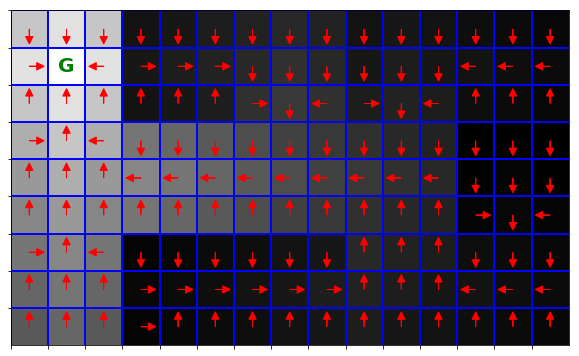

time: 191 ms


In [17]:
draw_policy(S, V, policy, (9,15), 20)

## Policy Iteration

In [18]:
policy, V, steps, updates = policy_iteration(S, A, P, 100, 0.9, 1e-8)

steps 18
q_updates 22914
ev_updates 4650
updates 27564
time: 141 ms


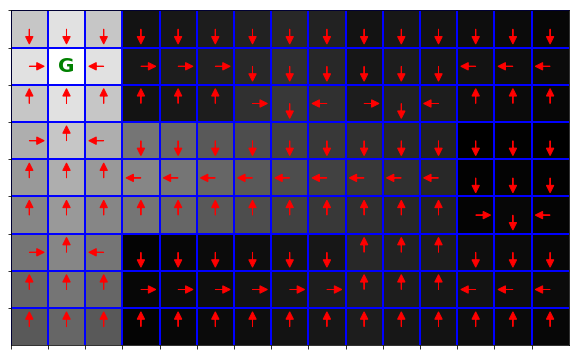

time: 192 ms


In [19]:
draw_policy(S, V, policy, (9,15), 20)

## Prioritized Sweeping

In [20]:
policy, V, steps, updates = prioritized_sweeping(S, A, P, 0.9, 1e-8)

steps 12309
updates 113120
time: 502 ms


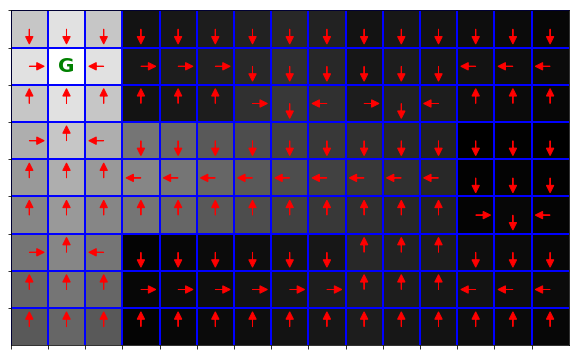

time: 187 ms


In [21]:
draw_policy(S, V, policy, (9,15), 20)

## LRTDP

In [22]:
policy, V, updates = lrtdp(0, S, A, P, 0.9, 1e-8)

updates 417
time: 2.93 ms


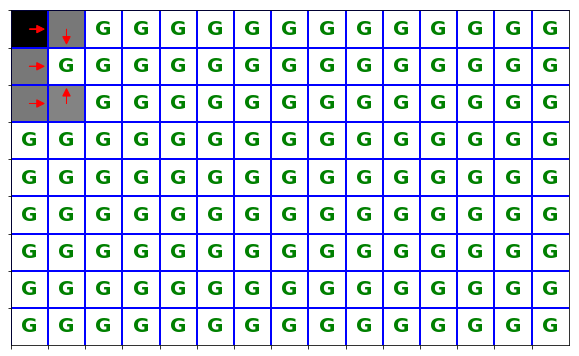

time: 281 ms


In [23]:
draw_policy(S, V, policy, (9,15), 20)

# Ambiente 2

15x9 - 11 floors 

In [24]:
S, A, P = loadFromDataPath('Dados_Relatorio1/Ambiente2/')

time: 293 ms


## Value Iteration

In [25]:
policy, V, steps, updates = value_iteration(S, A, P, 200, 0.9, 1e-8)

steps 159
updates 2132000
time: 2.63 s


Floor  1


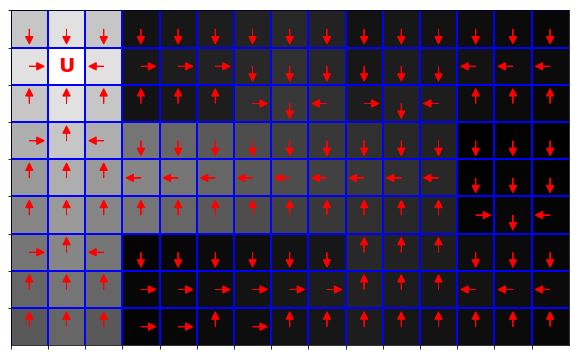

Floor  2


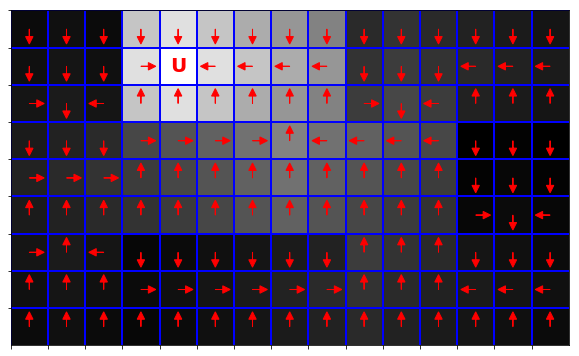

Floor  3


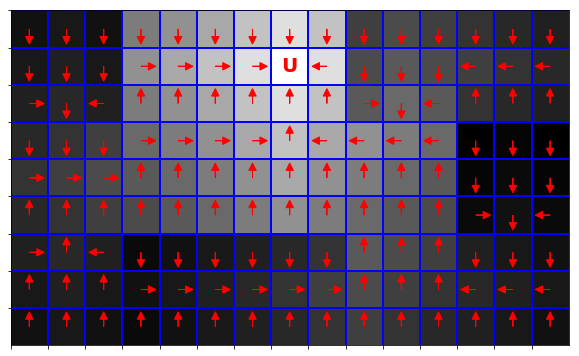

Floor  4


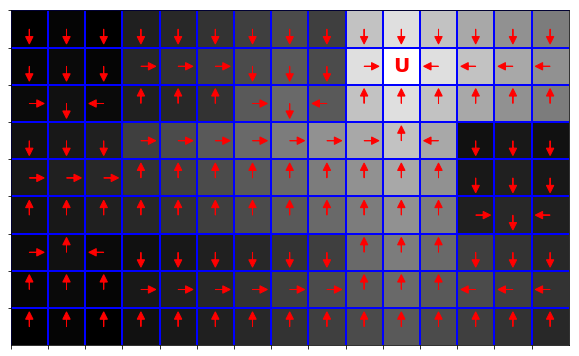

Floor  5


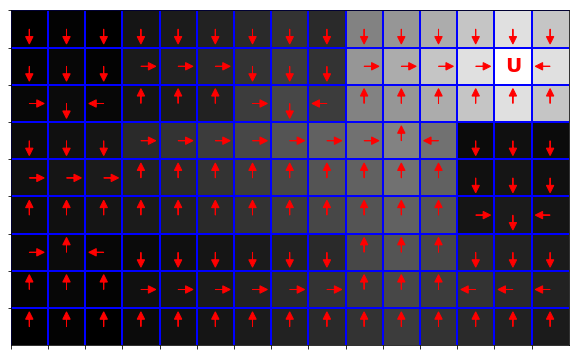

Floor  6


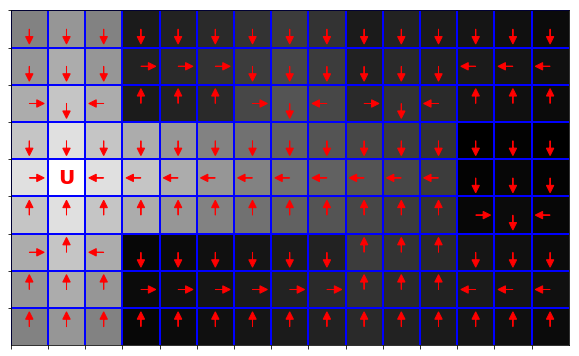

Floor  7


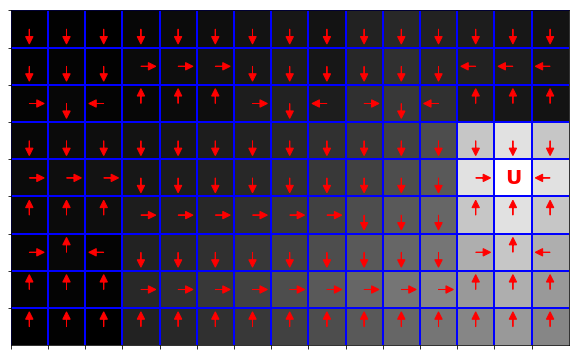

Floor  8


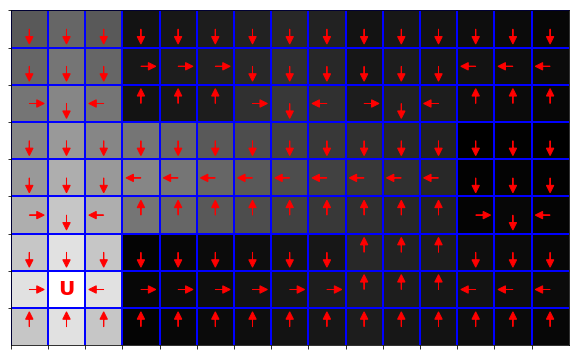

Floor  9


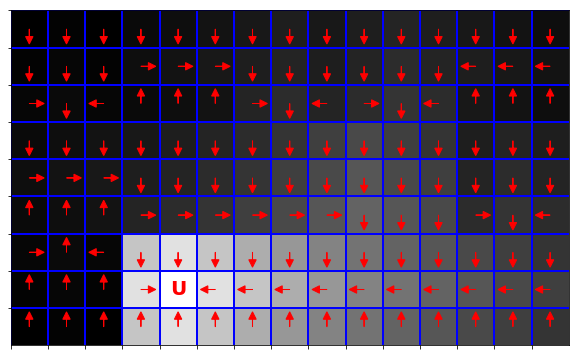

Floor  10


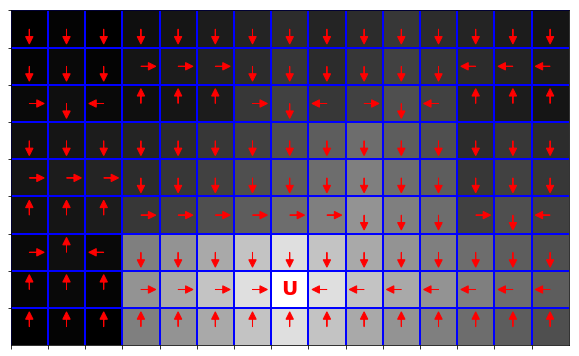

Floor  11


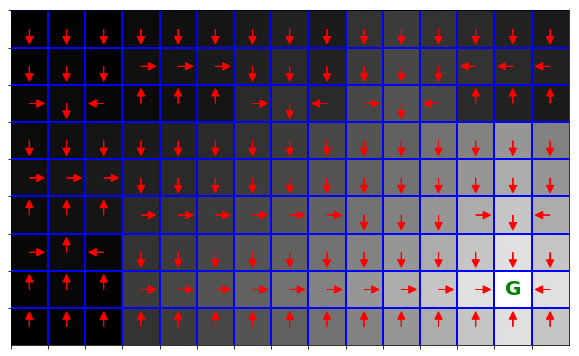

time: 2.28 s


In [26]:
S_reshaped = np.reshape(S, (11,135))
V_reshaped = np.reshape(V, (11,135))
policy_reshaped = np.reshape(policy, (11,135))

for i in range(11):
    print('Floor ',i+1)
    draw_policy(S_reshaped[i], V_reshaped[i], policy_reshaped[i], (9,15), 20)

## Policy Iteration

In [27]:
policy, V, steps, updates = policy_iteration(S, A, P, 200, 0.9, 1e-8)

steps 124
q_updates 1665625
ev_updates 340837
updates 2006462
time: 4.84 s


Floor  1


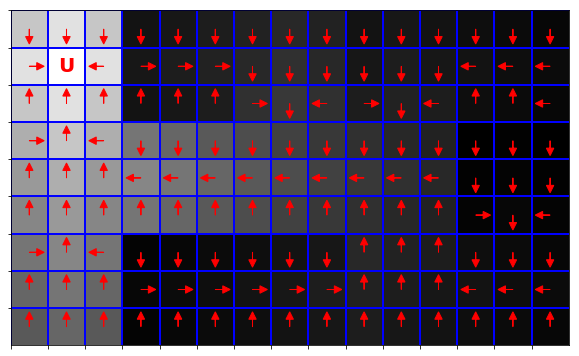

Floor  2


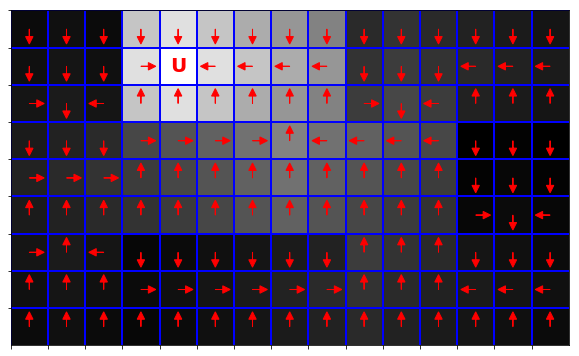

Floor  3


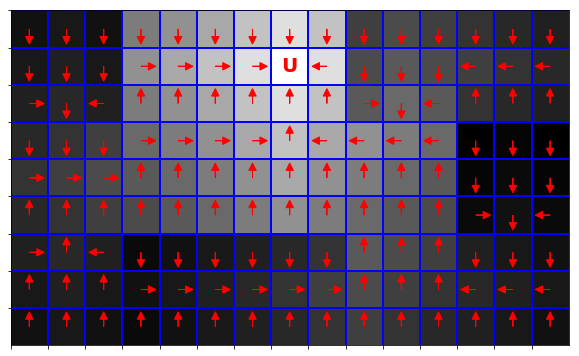

Floor  4


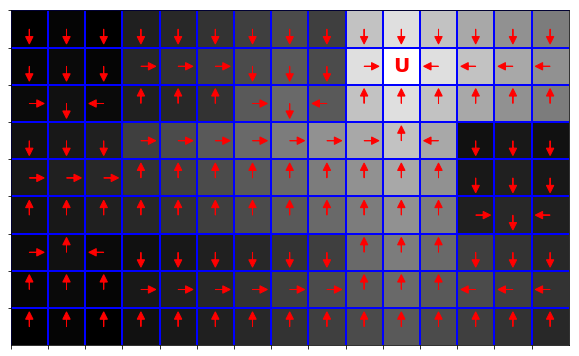

Floor  5


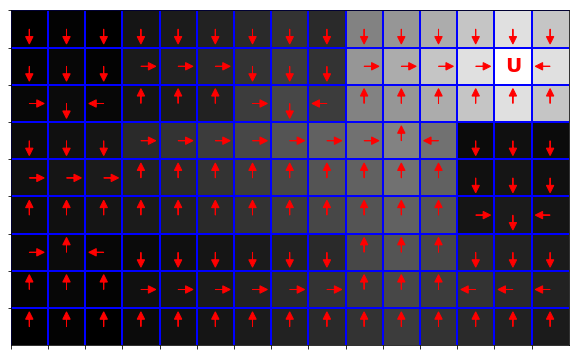

Floor  6


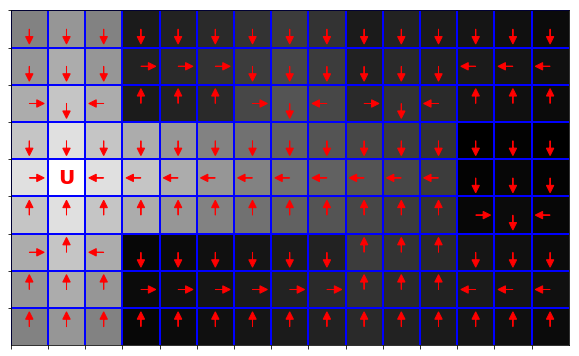

Floor  7


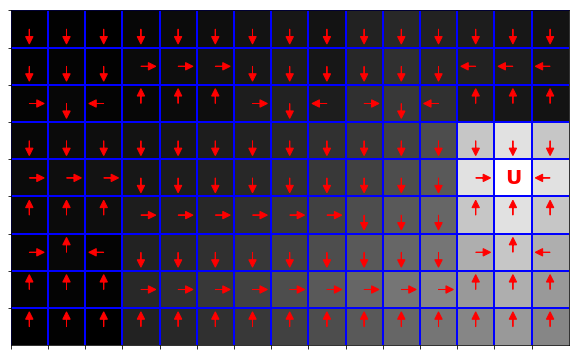

Floor  8


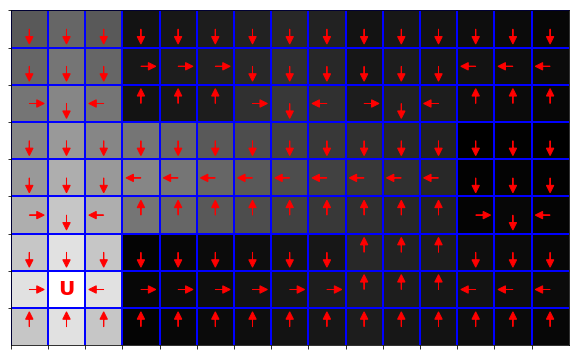

Floor  9


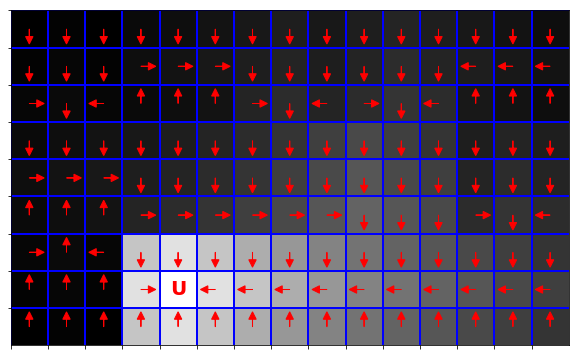

Floor  10


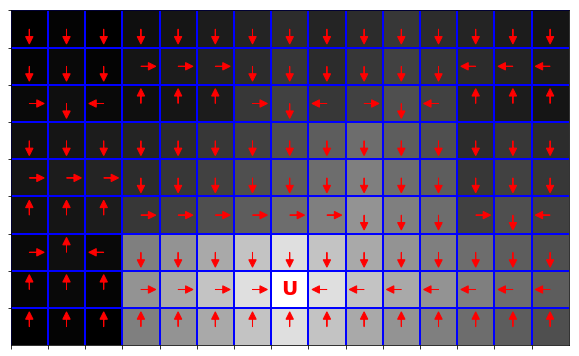

Floor  11


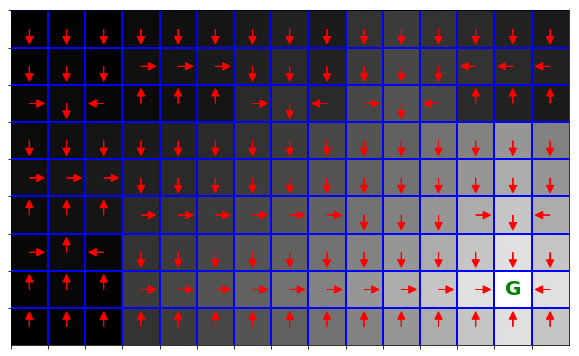

time: 2.27 s


In [28]:
S_reshaped = np.reshape(S, (11,135))
V_reshaped = np.reshape(V, (11,135))
policy_reshaped = np.reshape(policy, (11,135))

for i in range(11):
    print('Floor ',i+1)
    draw_policy(S_reshaped[i], V_reshaped[i], policy_reshaped[i], (9,15), 20)

## Prioritized Sweeping

In [29]:
policy, V, steps, updates = prioritized_sweeping(S, A, P, 0.9, 1e-8)

steps 509045
updates 4660985
time: 25.4 s


Floor  1


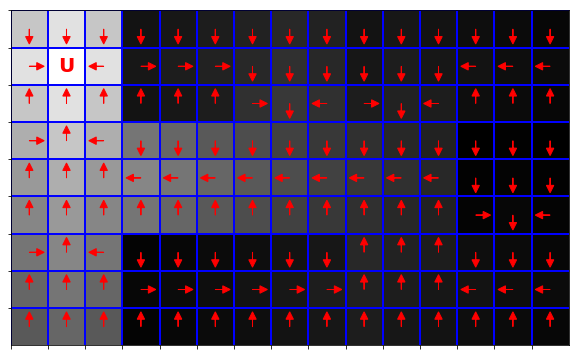

Floor  2


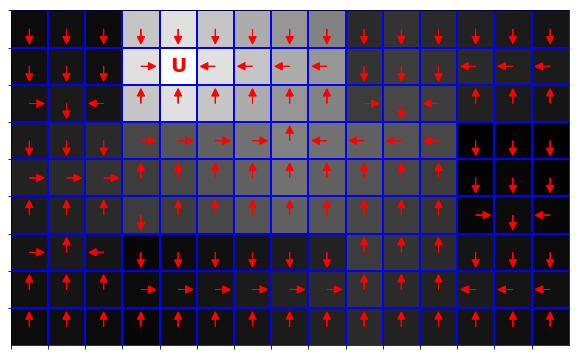

Floor  3


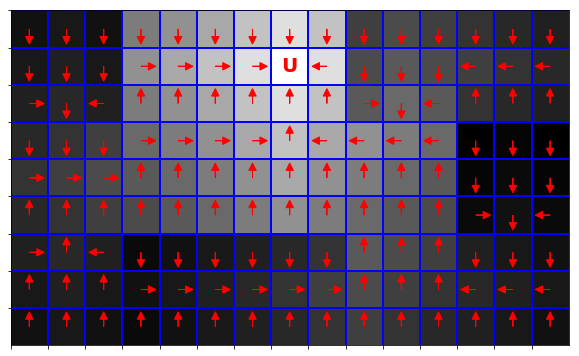

Floor  4


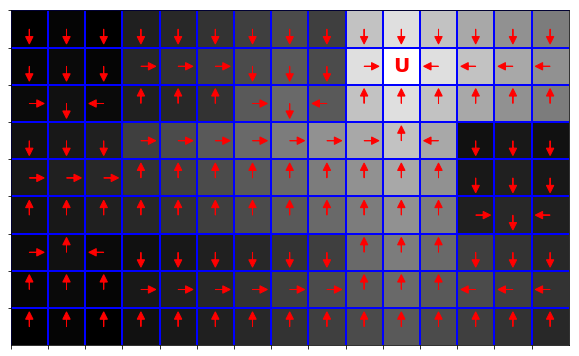

Floor  5


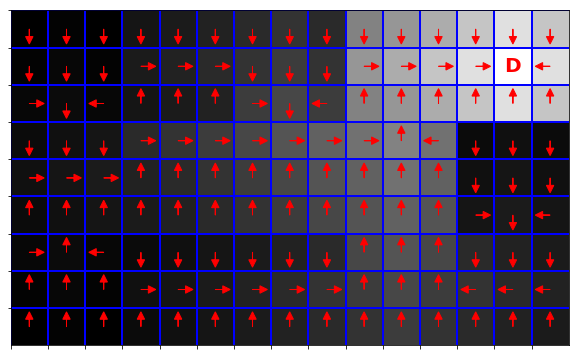

Floor  6


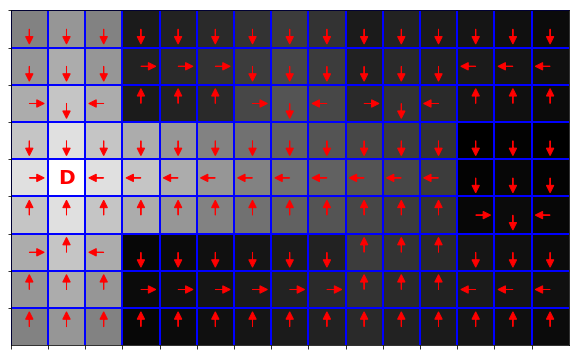

Floor  7


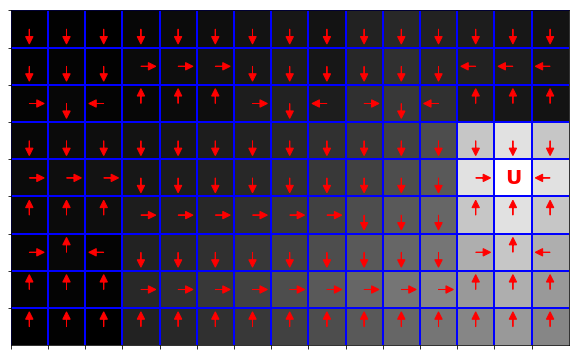

Floor  8


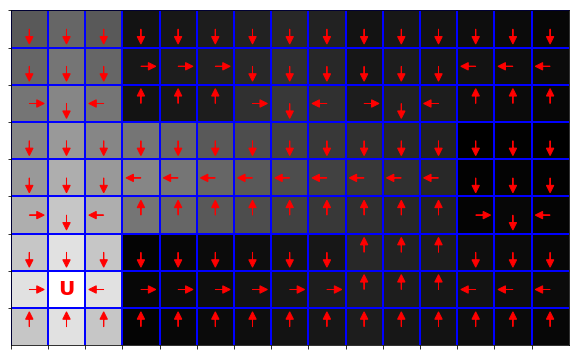

Floor  9


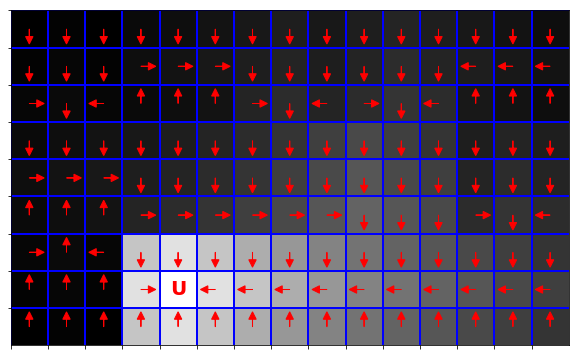

Floor  10


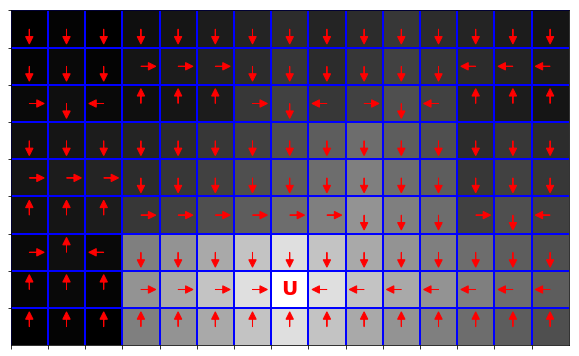

Floor  11


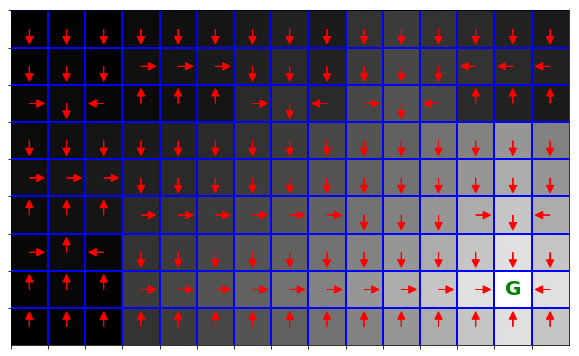

time: 2.21 s


In [30]:
S_reshaped = np.reshape(S, (11,135))
V_reshaped = np.reshape(V, (11,135))
policy_reshaped = np.reshape(policy, (11,135))

for i in range(11):
    print('Floor ',i+1)
    draw_policy(S_reshaped[i], V_reshaped[i], policy_reshaped[i], (9,15), 20)

## LRTDP

In [31]:
policy, V, updates = lrtdp(0, S, A, P, 0.9, 1e-8)

updates 1600093
time: 3.06 s


Floor  1


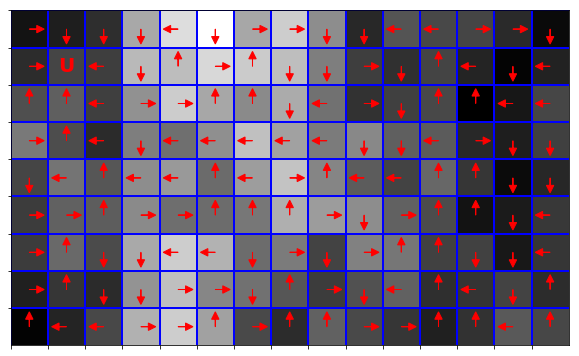

Floor  2


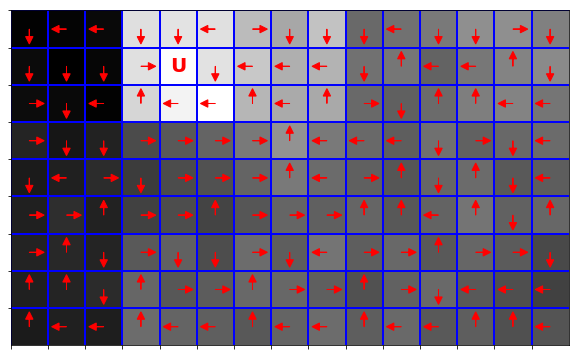

Floor  3


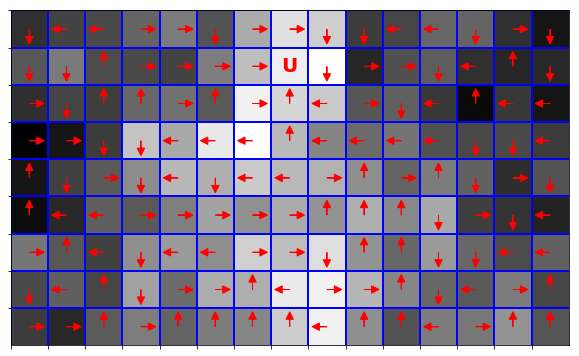

Floor  4


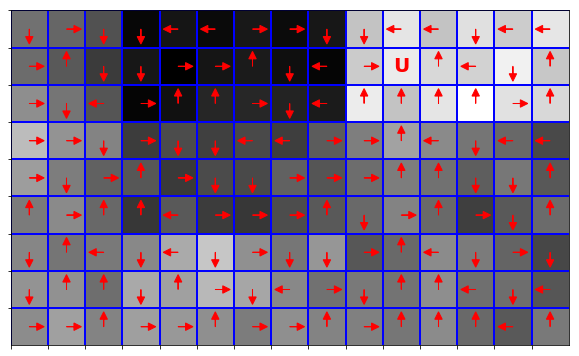

Floor  5


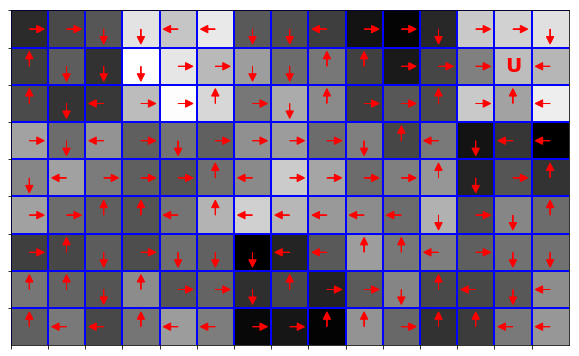

Floor  6


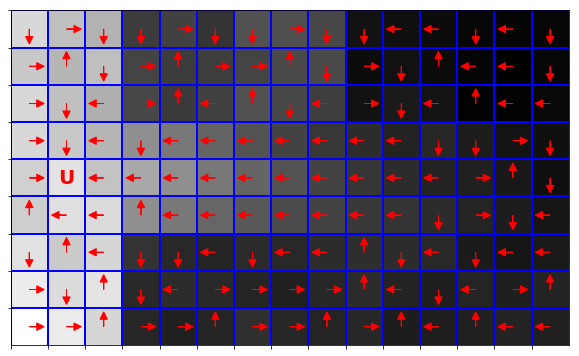

Floor  7


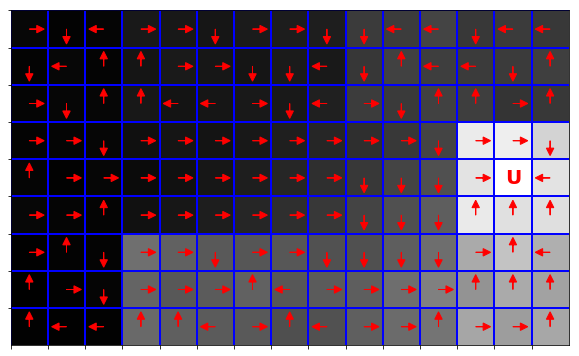

Floor  8


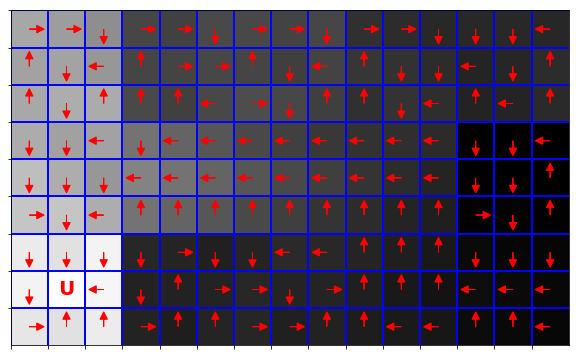

Floor  9


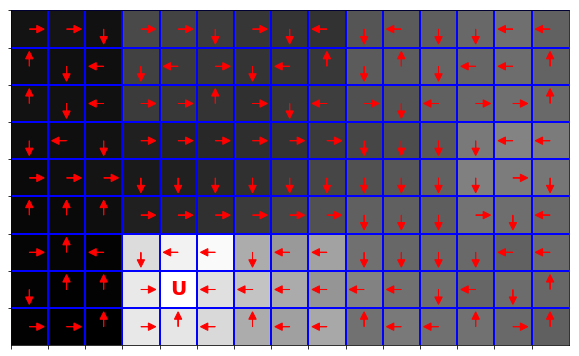

Floor  10


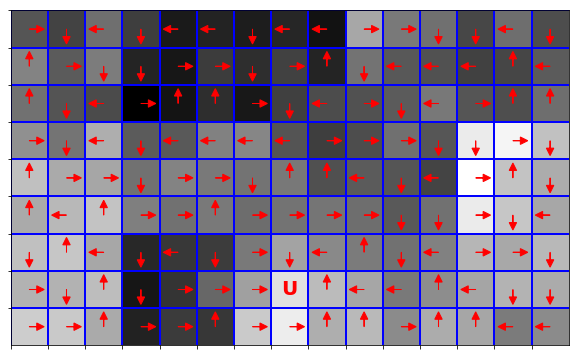

Floor  11


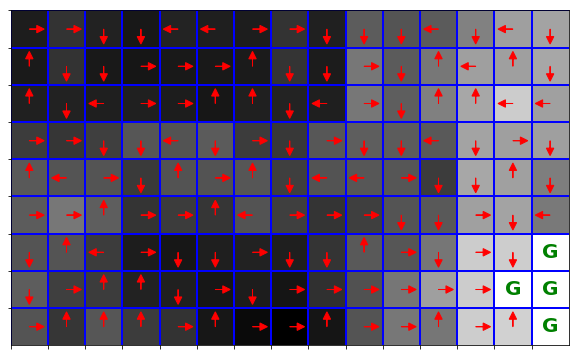

time: 2.26 s


In [32]:
S_reshaped = np.reshape(S, (11,135))
V_reshaped = np.reshape(V, (11,135))
policy_reshaped = np.reshape(policy, (11,135))

for i in range(11):
    print('Floor ',i+1)
    draw_policy(S_reshaped[i], V_reshaped[i], policy_reshaped[i], (9,15), 20)

# Ambiente 3
18x30 - 35 floors

In [33]:
S, A, P = loadFromDataPath('Dados_Relatorio1/Ambiente3/')

time: 29.3 s


## Value Iteration

In [34]:
policy, V, steps, updates = value_iteration(S, A, P, 600, 0.99, 1e-8)

steps 589
updates 101222170
time: 2min 21s


Floor  1


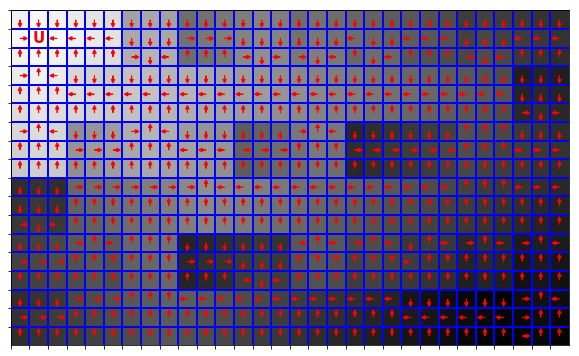

Floor  2


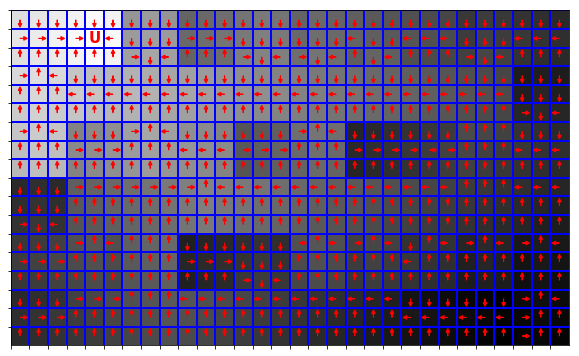

Floor  3


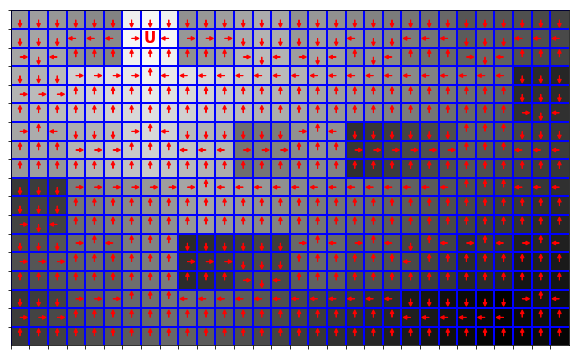

Floor  4


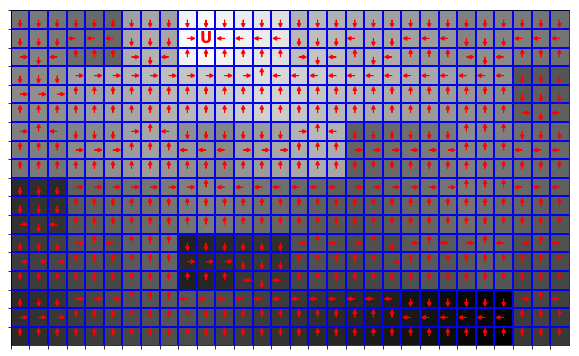

Floor  5


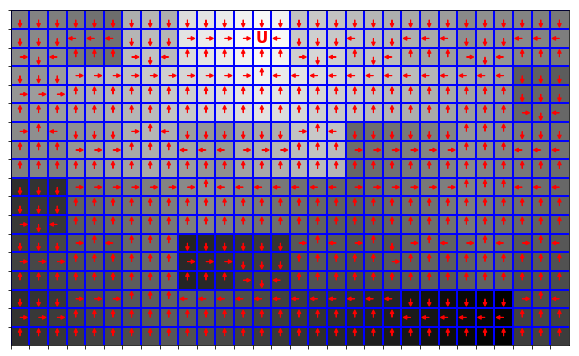

Floor  6


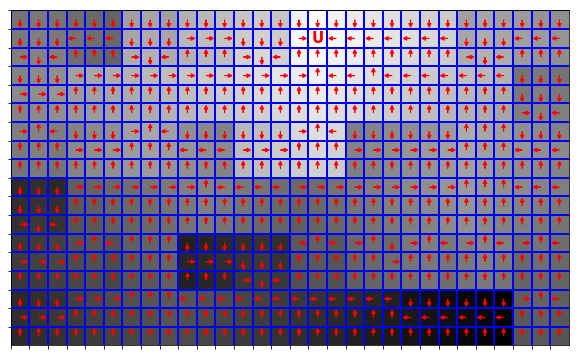

Floor  7


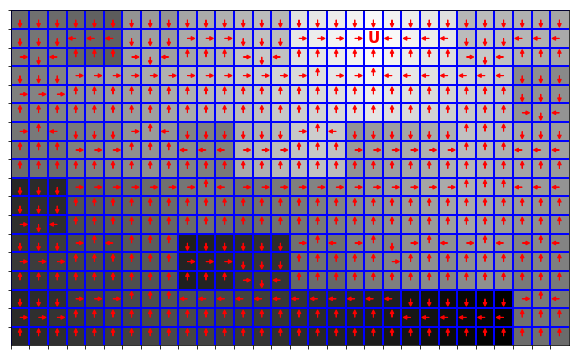

Floor  8


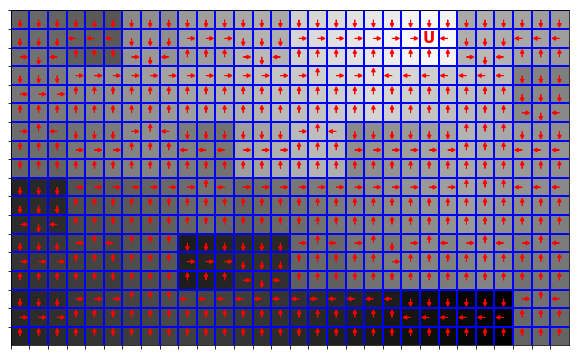

Floor  9


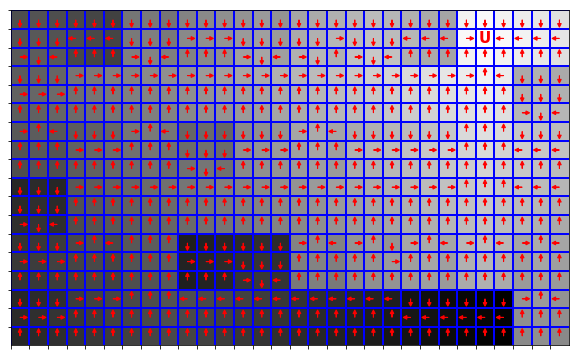

Floor  10


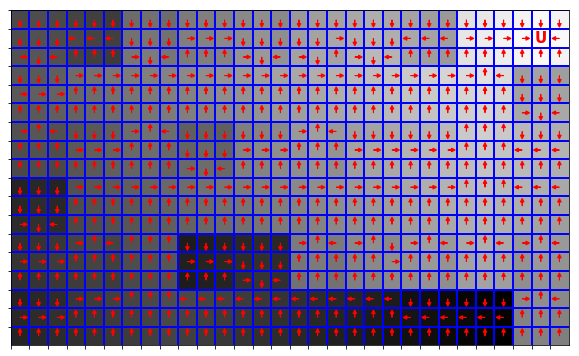

Floor  11


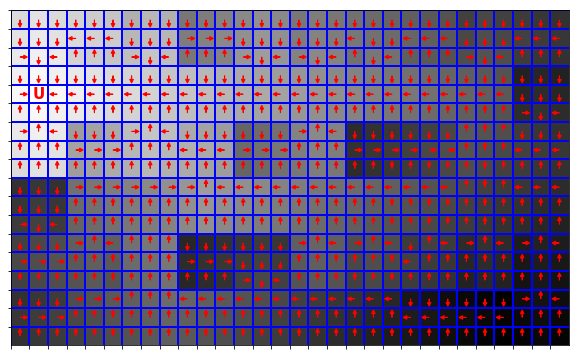

Floor  12


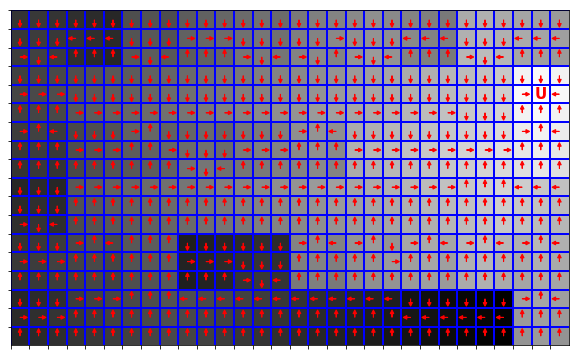

Floor  13


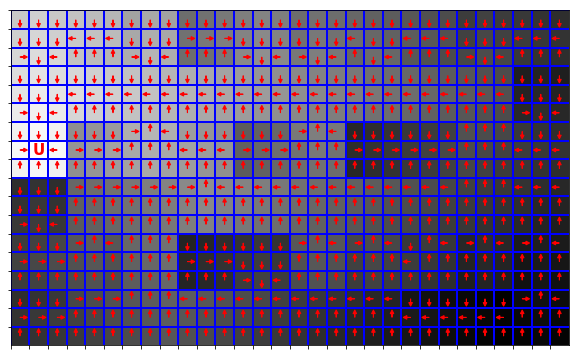

Floor  14


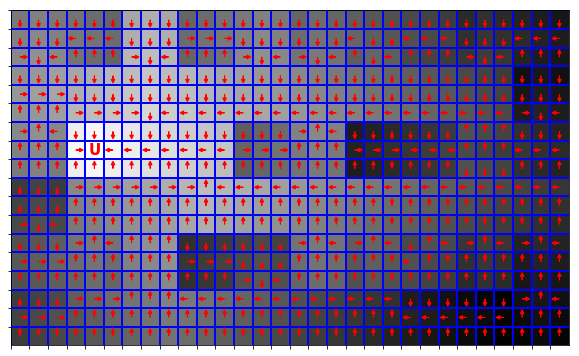

Floor  15


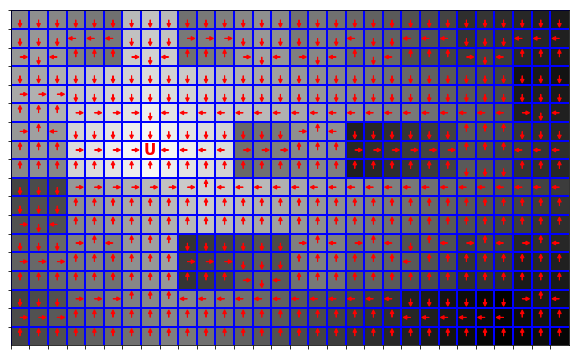

Floor  16


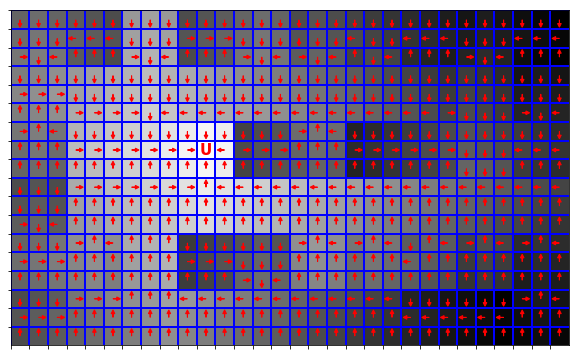

Floor  17


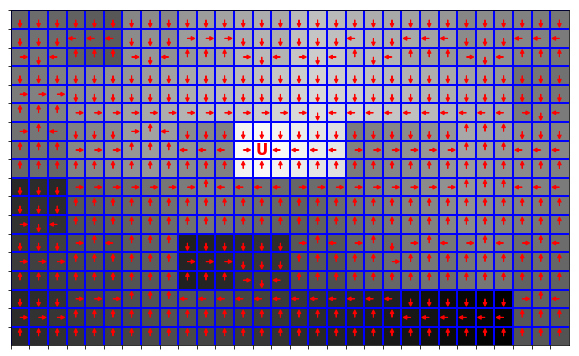

Floor  18


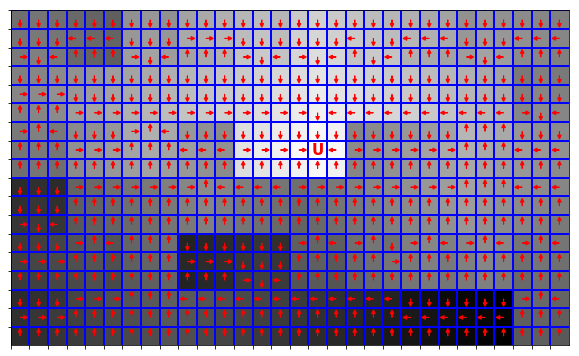

Floor  19


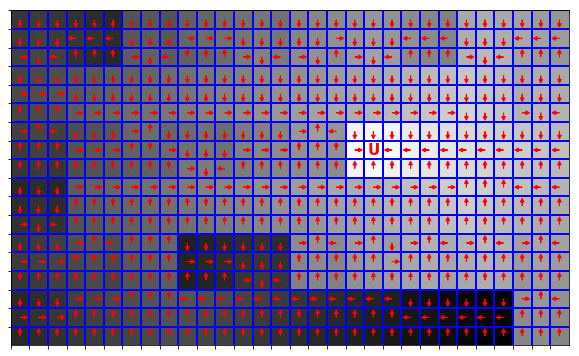

Floor  20


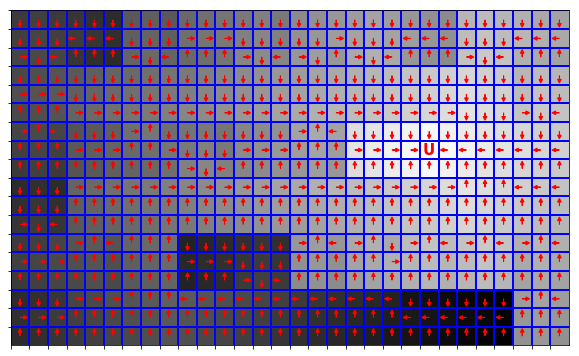

Floor  21


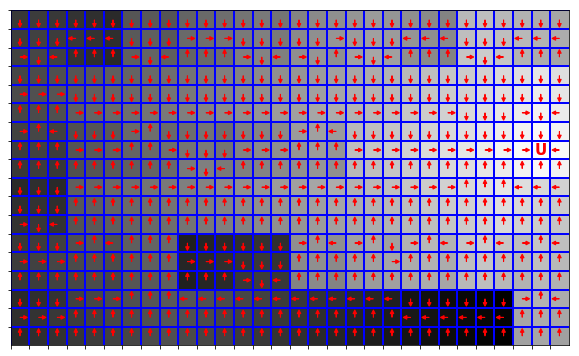

Floor  22


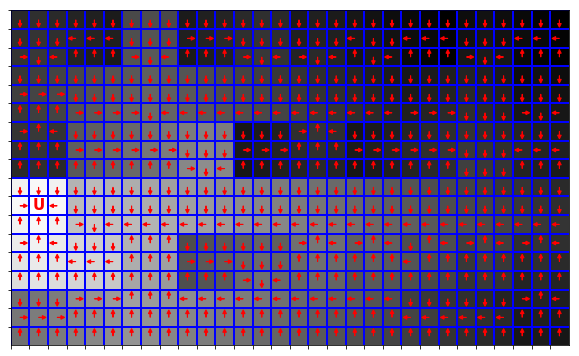

Floor  23


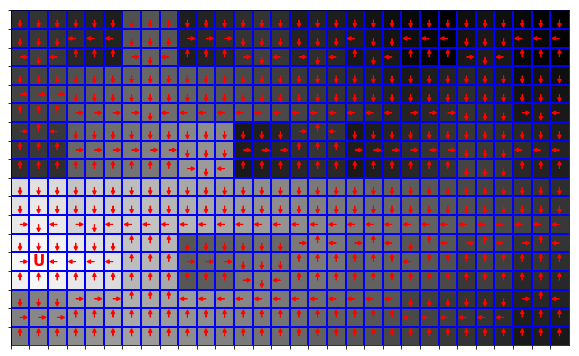

Floor  24


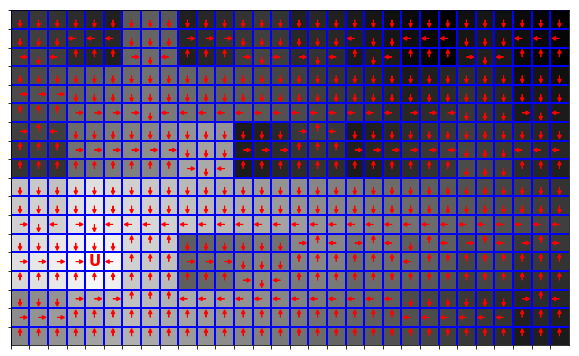

Floor  25


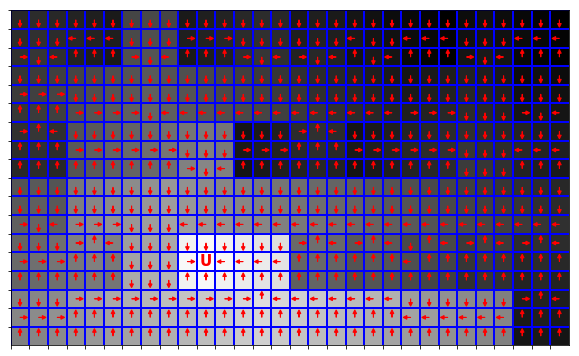

Floor  26


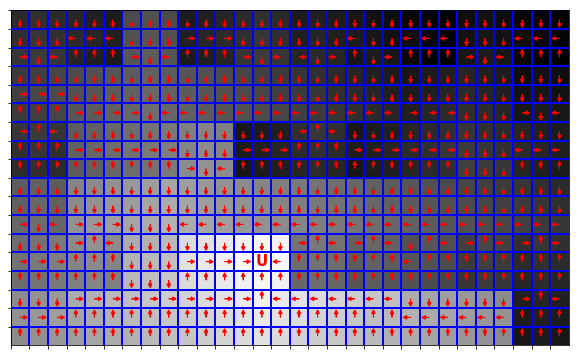

Floor  27


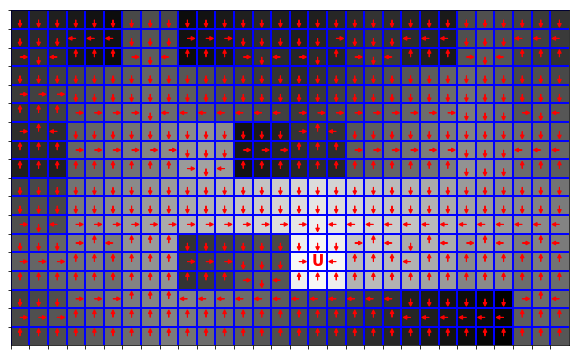

Floor  28


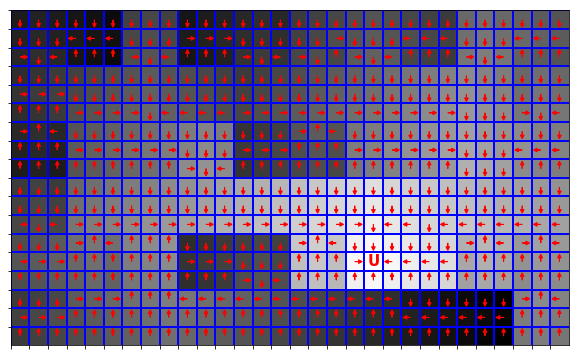

Floor  29


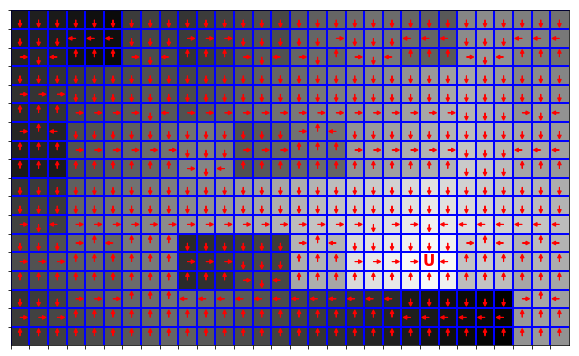

Floor  30


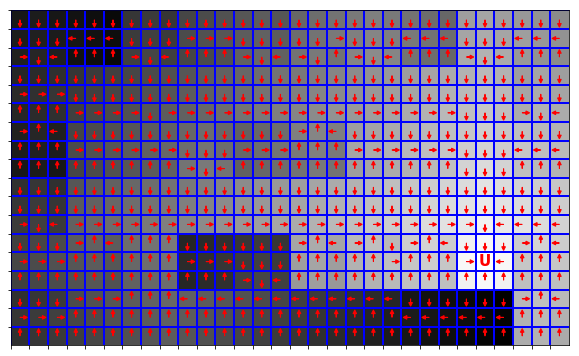

Floor  31


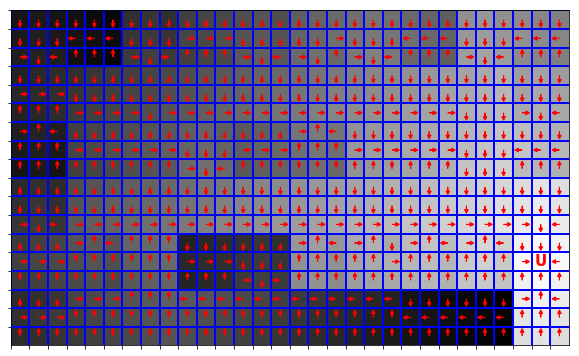

Floor  32


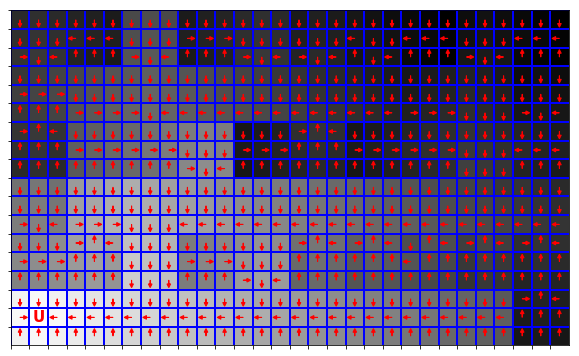

Floor  33


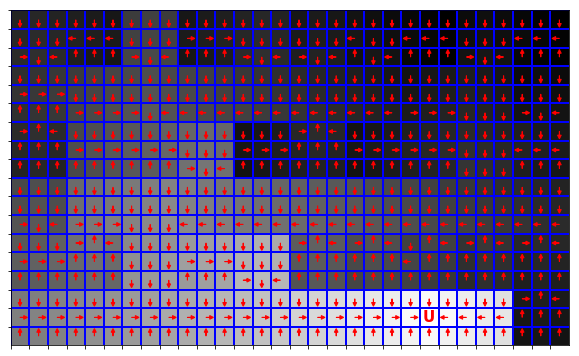

Floor  34


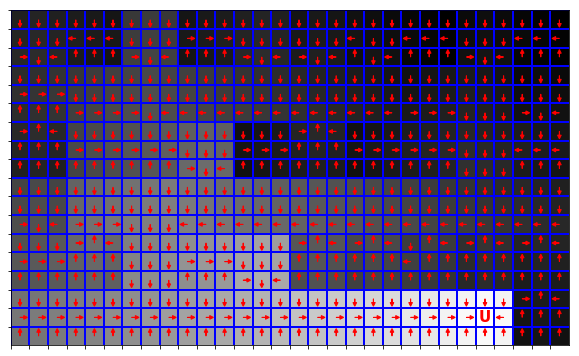

Floor  35


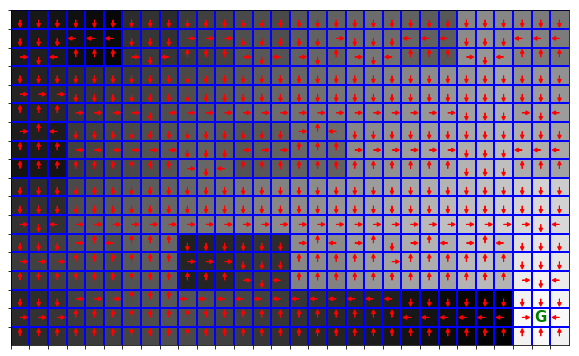

time: 17.7 s


In [35]:
S_reshaped = np.reshape(S, (35,540))
V_reshaped = np.reshape(V, (35,540))
policy_reshaped = np.reshape(policy, (35,540))

for i in range(35):
    print('Floor ',i+1)
    draw_policy(S_reshaped[i], V_reshaped[i], policy_reshaped[i], (18,30), 15)

## Policy Iteration

In [36]:
policy, V, steps, updates  = policy_iteration(S, A, P, 600, 0.99, 1e-8)

steps 469
q_updates 80634610
ev_updates 16195966
updates 96830576
time: 6min 24s


Floor  1


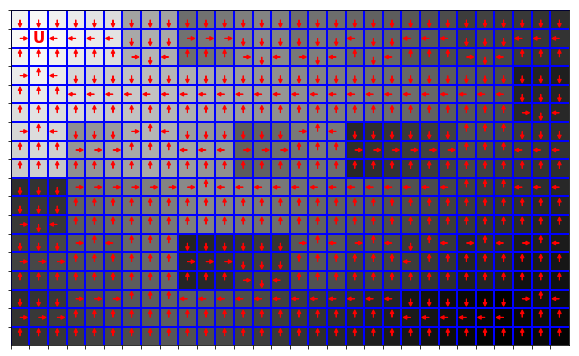

Floor  2


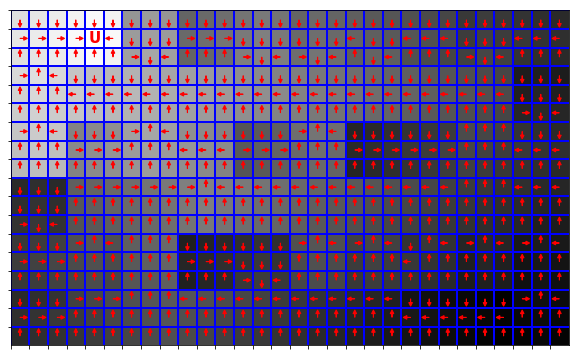

Floor  3


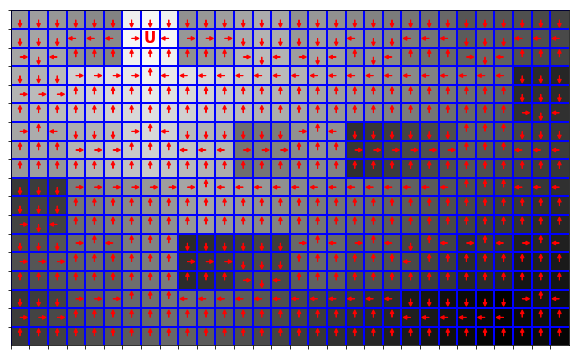

Floor  4


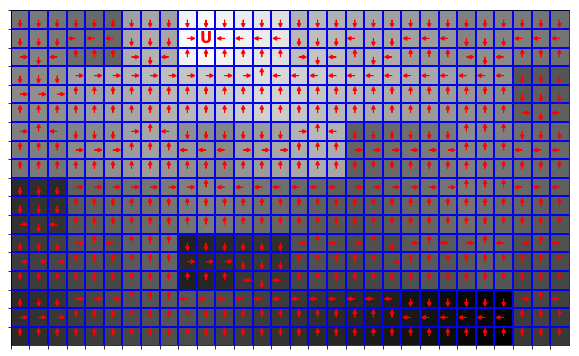

Floor  5


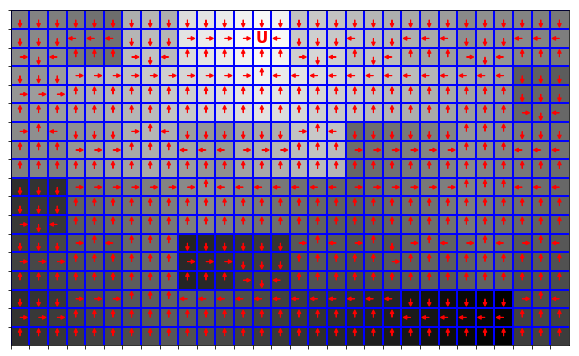

Floor  6


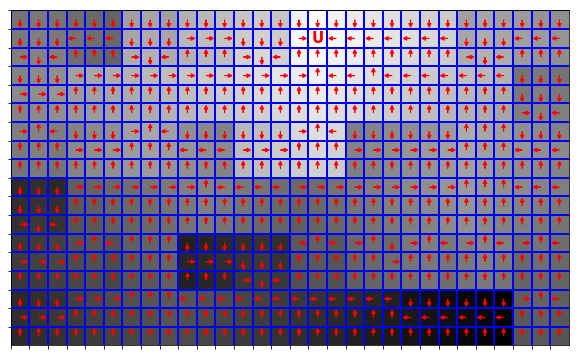

Floor  7


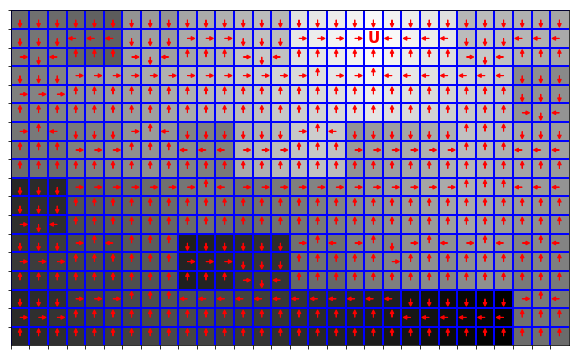

Floor  8


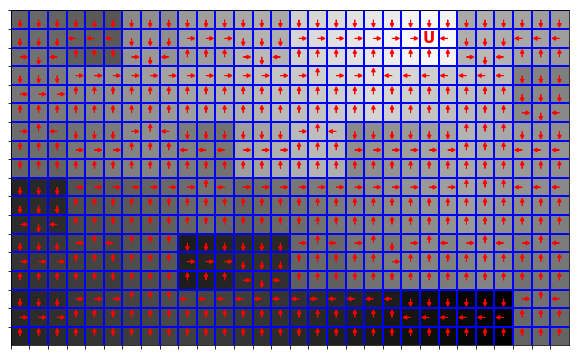

Floor  9


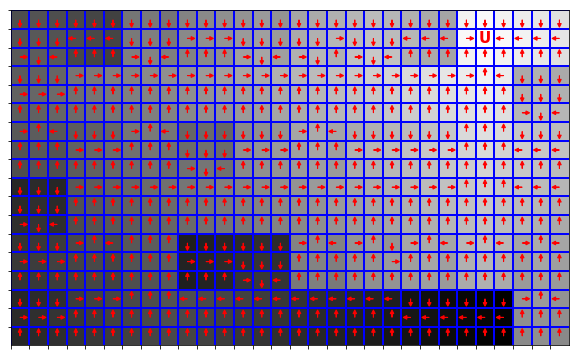

Floor  10


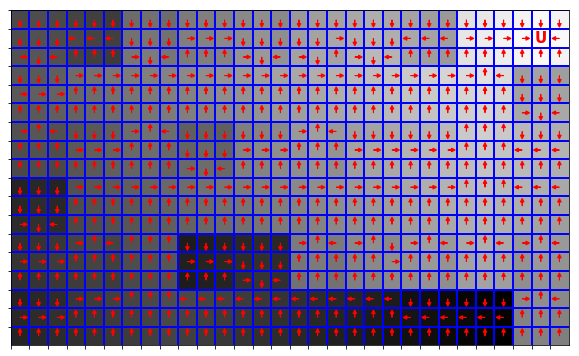

Floor  11


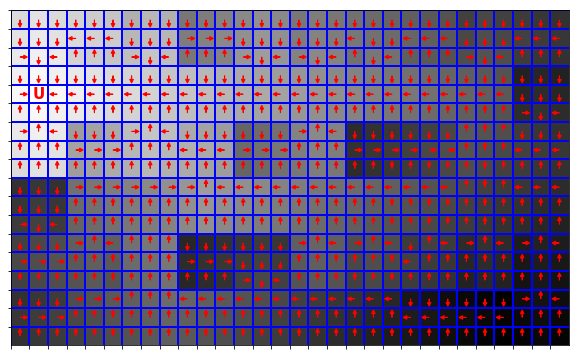

Floor  12


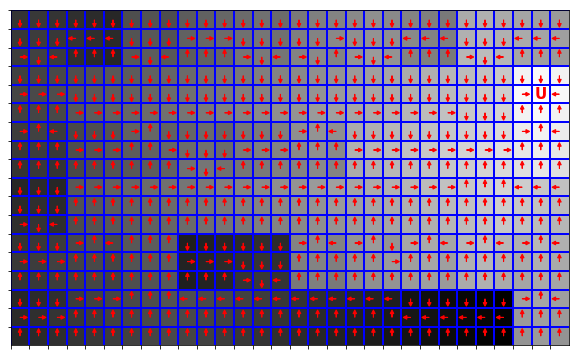

Floor  13


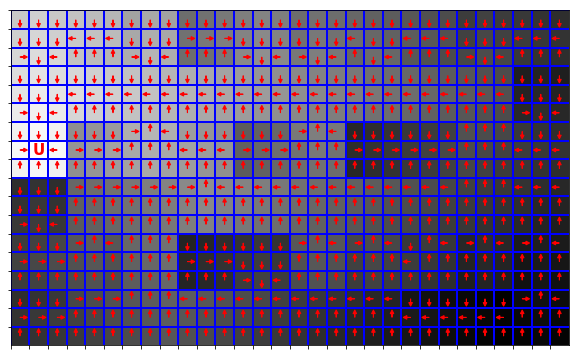

Floor  14


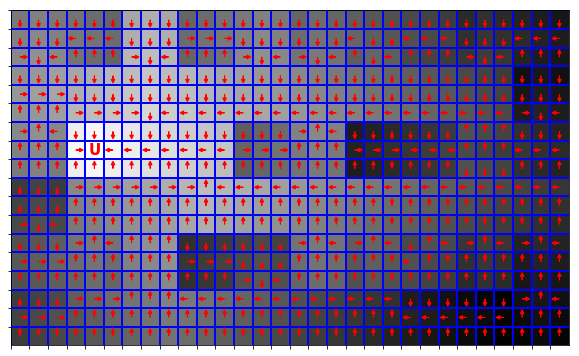

Floor  15


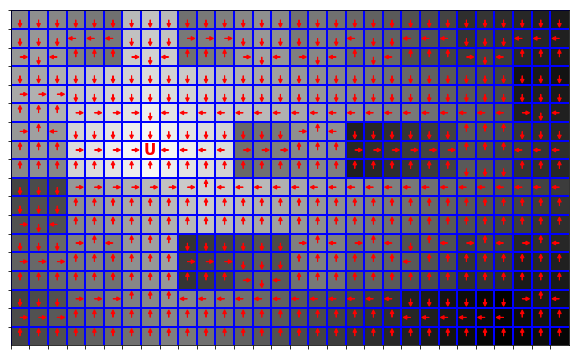

Floor  16


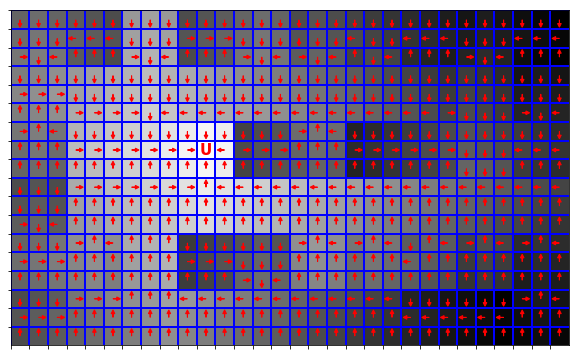

Floor  17


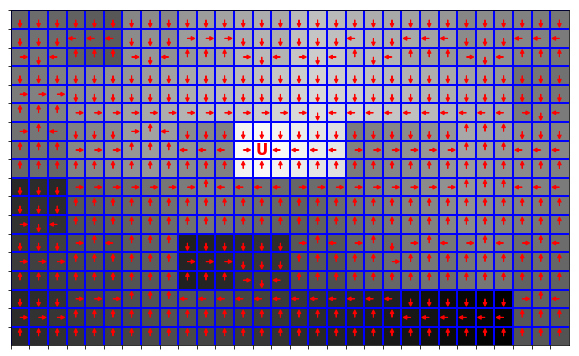

Floor  18


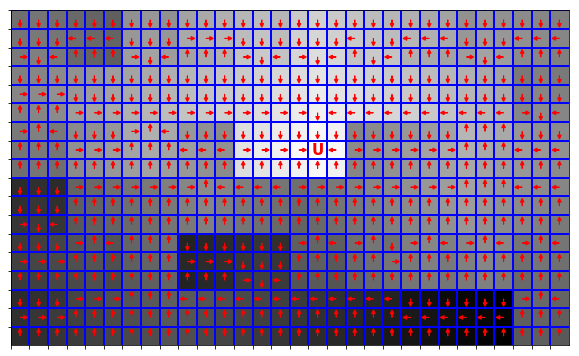

Floor  19


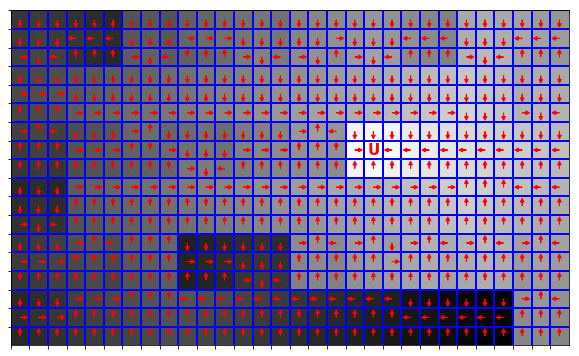

Floor  20


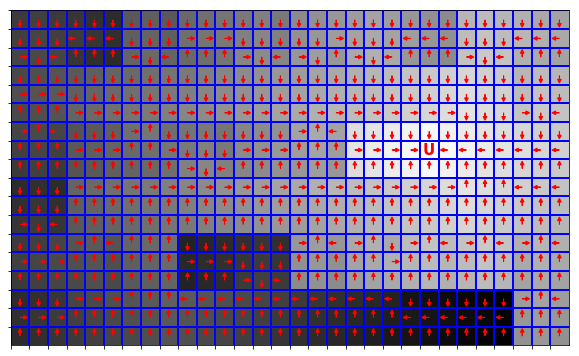

Floor  21


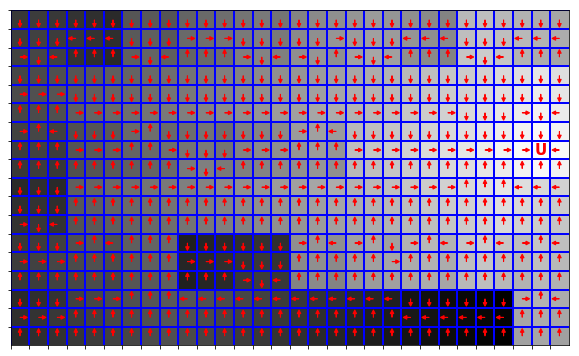

Floor  22


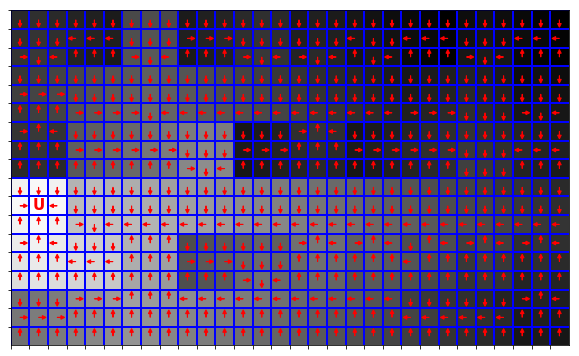

Floor  23


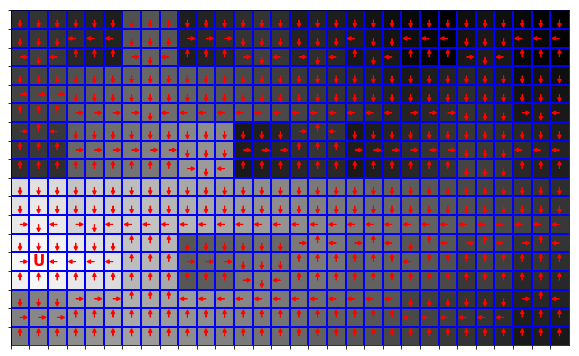

Floor  24


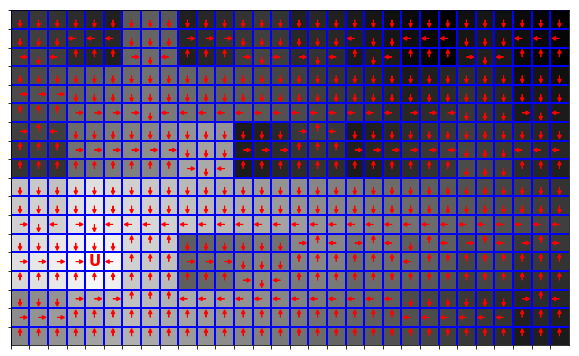

Floor  25


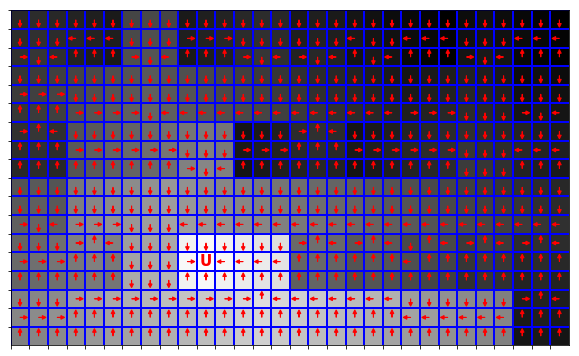

Floor  26


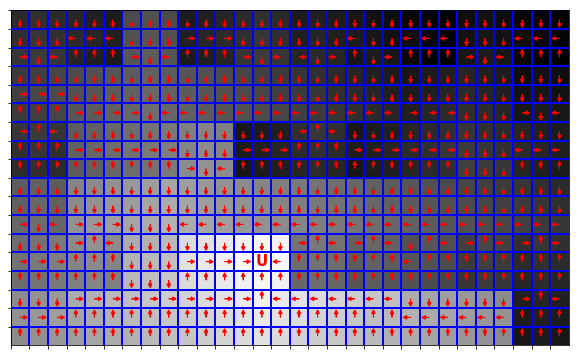

Floor  27


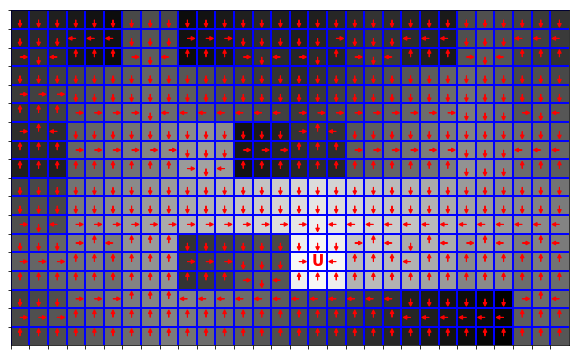

Floor  28


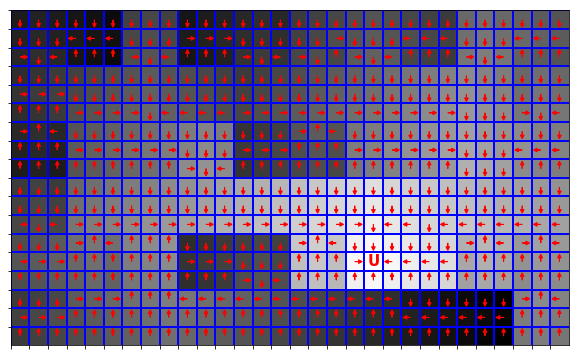

Floor  29


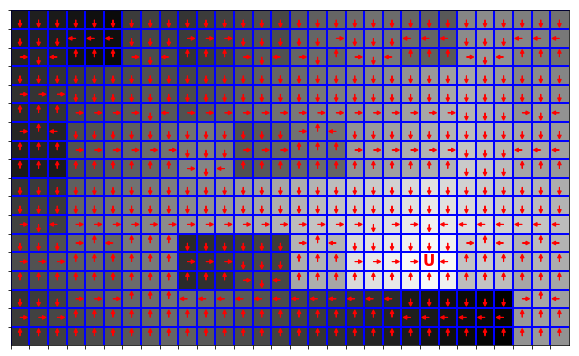

Floor  30


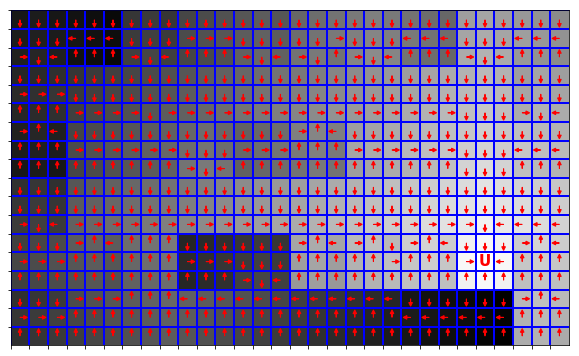

Floor  31


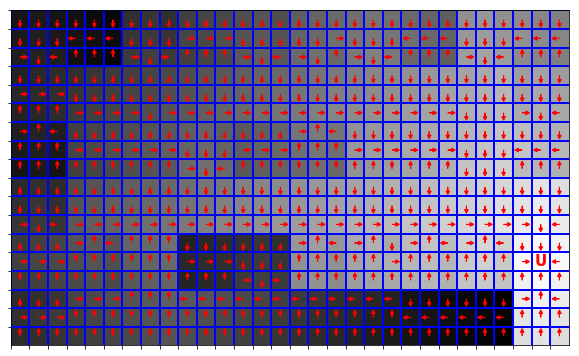

Floor  32


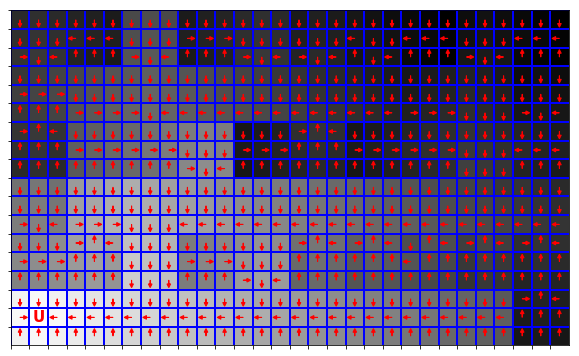

Floor  33


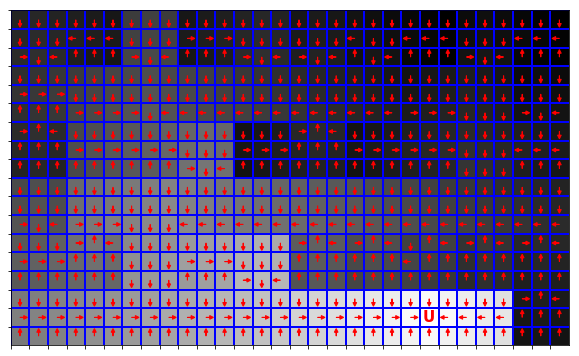

Floor  34


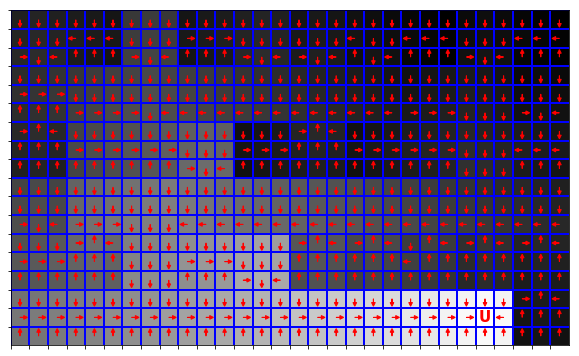

Floor  35


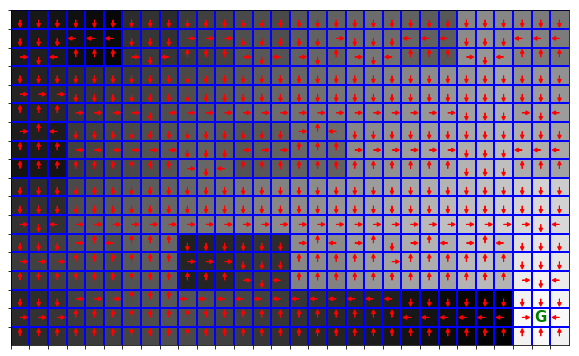

time: 17.1 s


In [37]:
S_reshaped = np.reshape(S, (35,540))
V_reshaped = np.reshape(V, (35,540))
policy_reshaped = np.reshape(policy, (35,540))

for i in range(35):
    print('Floor ',i+1)
    draw_policy(S_reshaped[i], V_reshaped[i], policy_reshaped[i], (18,30), 15)

## LRTDP

In [38]:
policy, V, updates = lrtdp(0, S, A, P, 0.9, 1e-8)

updates 28469542
time: 2min 33s


Floor  1


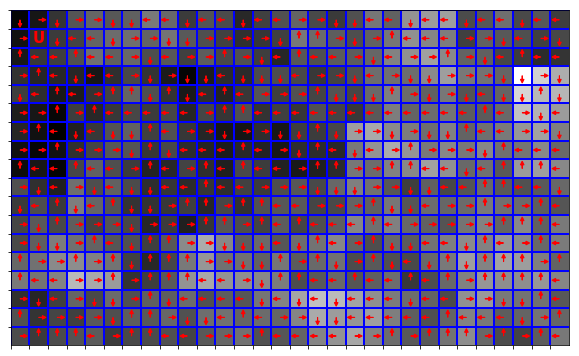

Floor  2


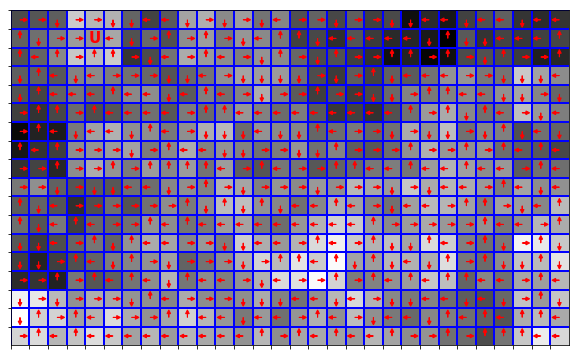

Floor  3


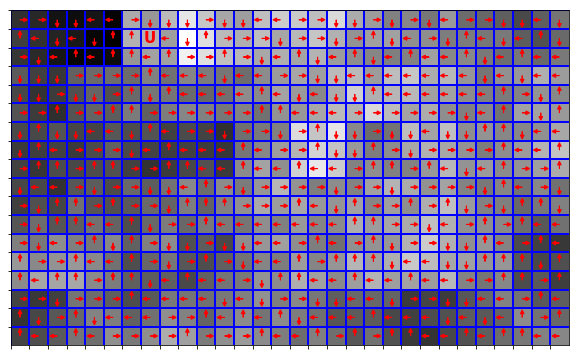

Floor  4


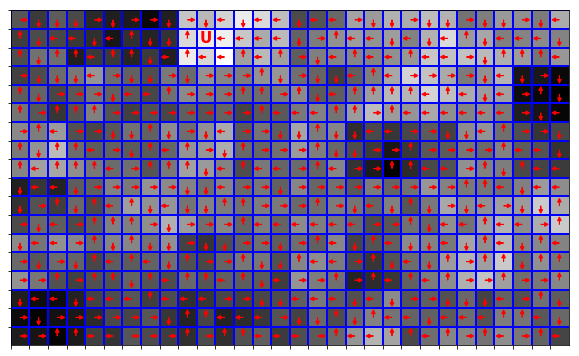

Floor  5


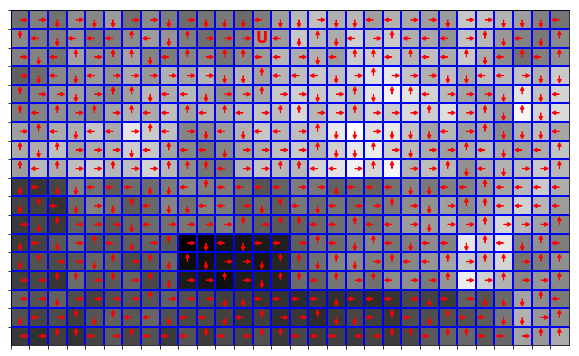

Floor  6


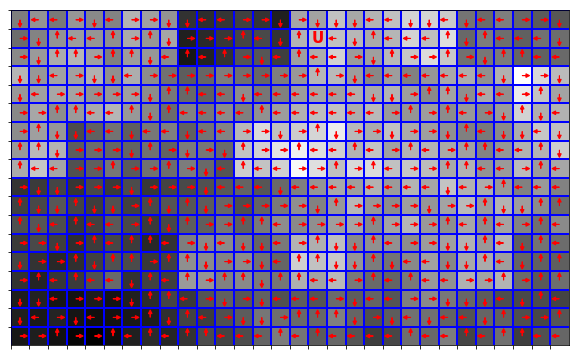

Floor  7


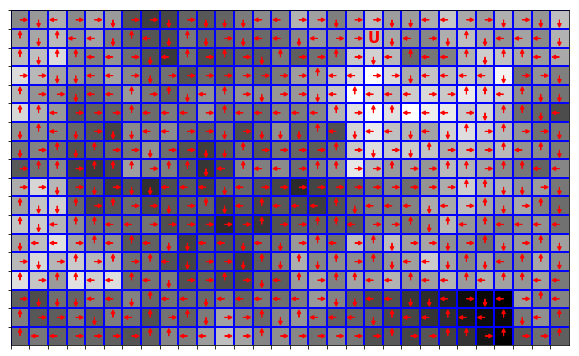

Floor  8


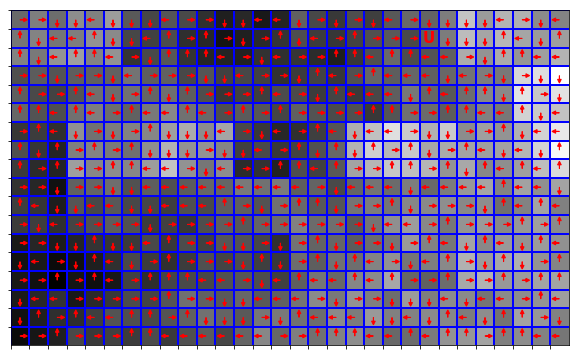

Floor  9


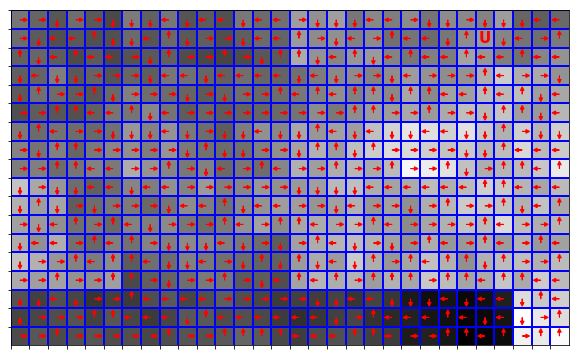

Floor  10


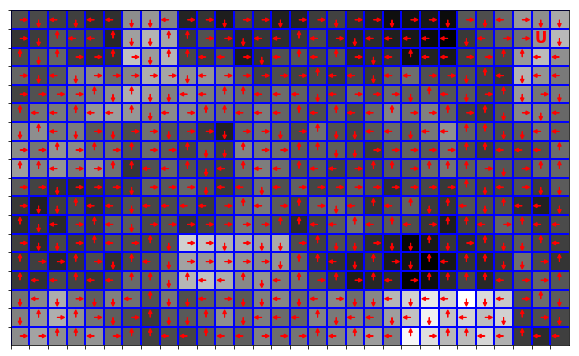

Floor  11


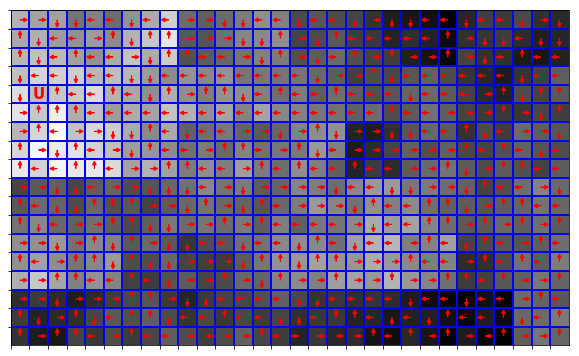

Floor  12


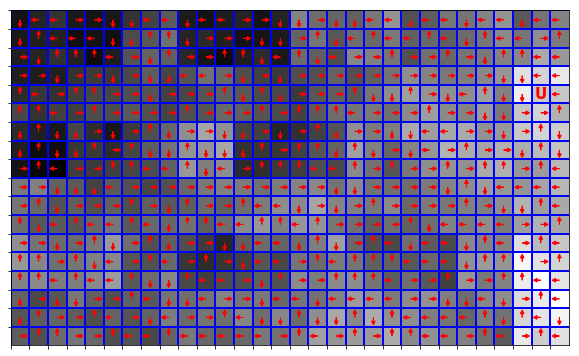

Floor  13


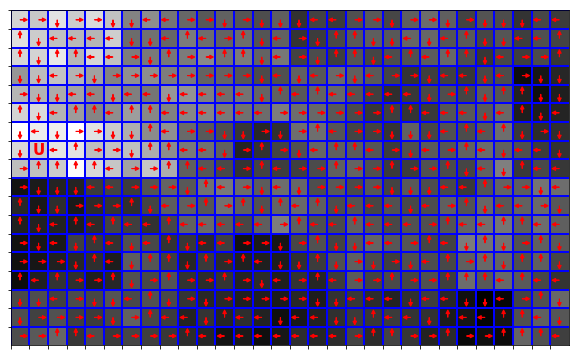

Floor  14


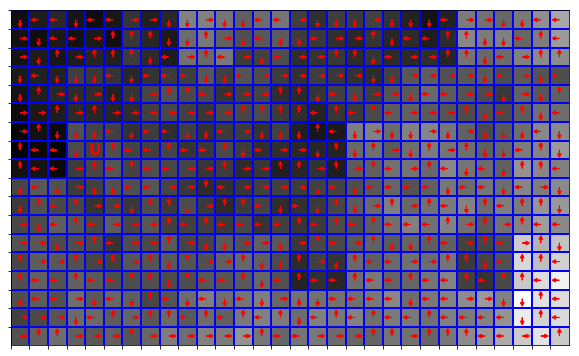

Floor  15


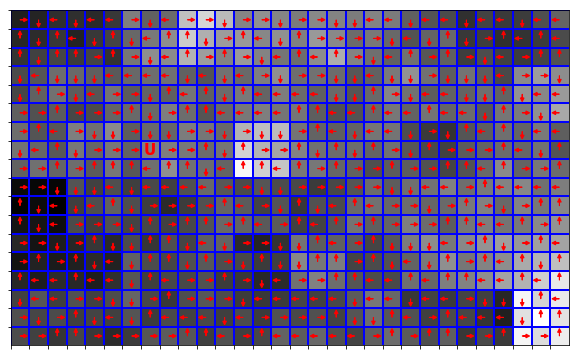

Floor  16


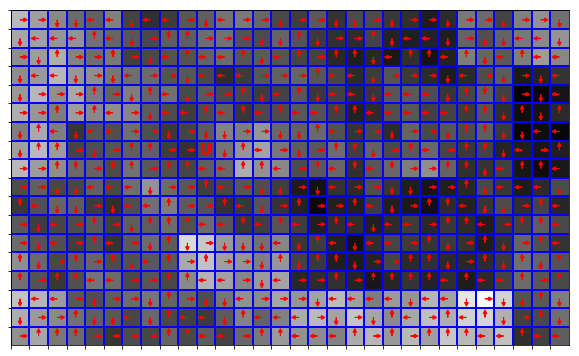

Floor  17


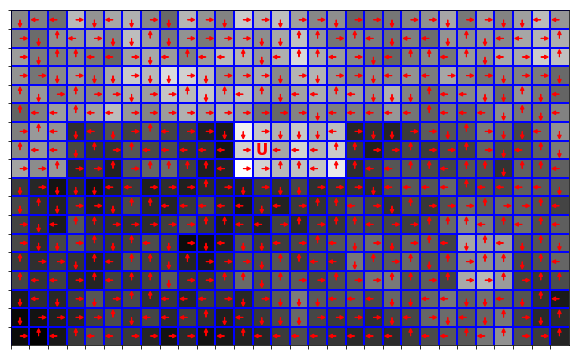

Floor  18


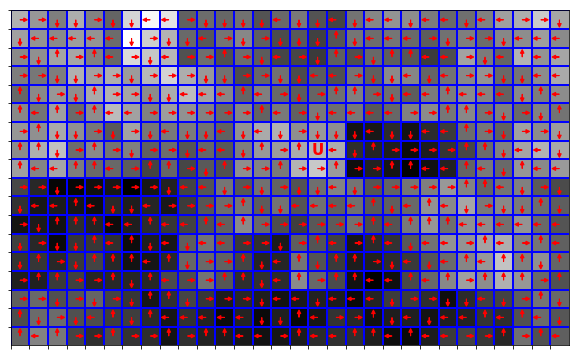

Floor  19


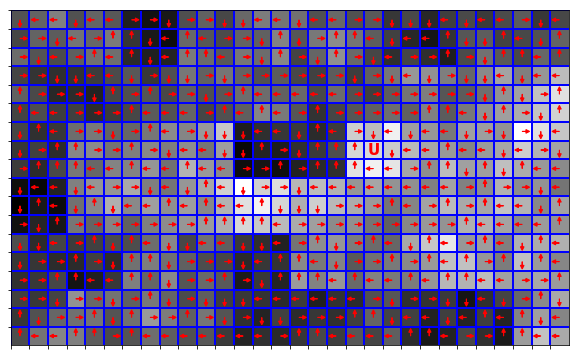

Floor  20


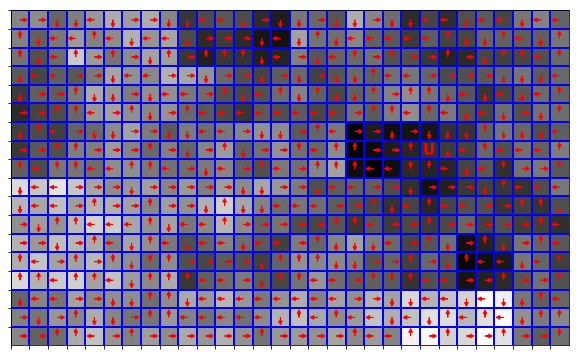

Floor  21


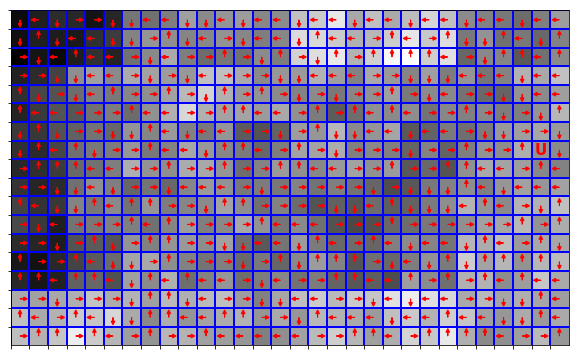

Floor  22


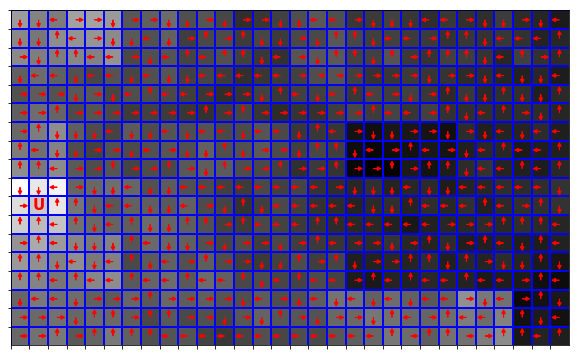

Floor  23


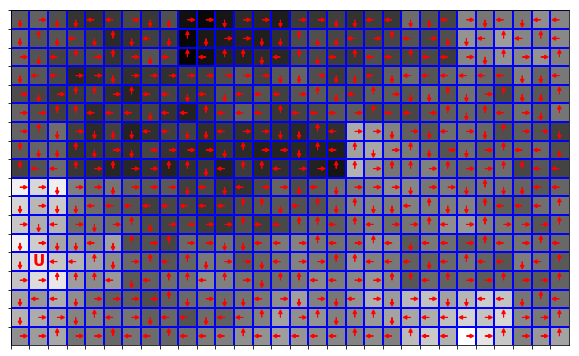

Floor  24


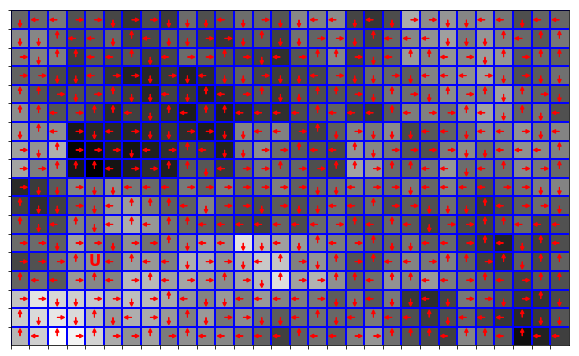

Floor  25


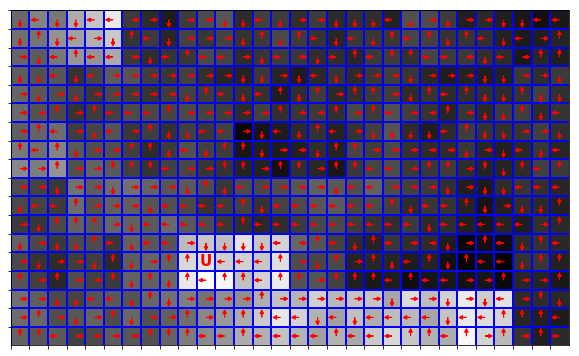

Floor  26


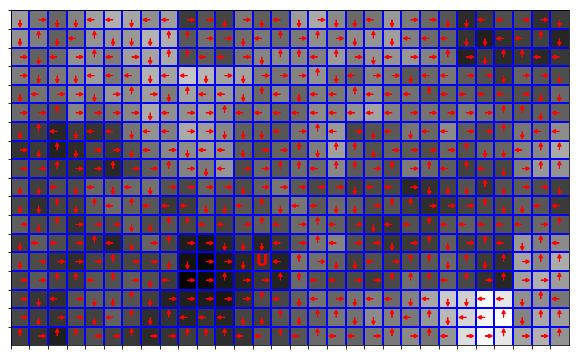

Floor  27


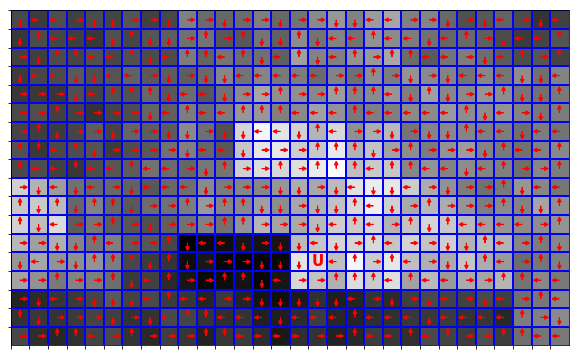

Floor  28


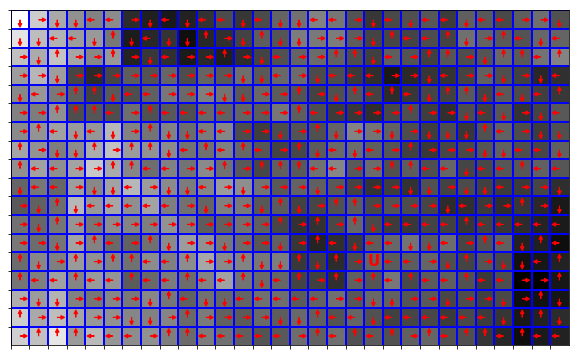

Floor  29


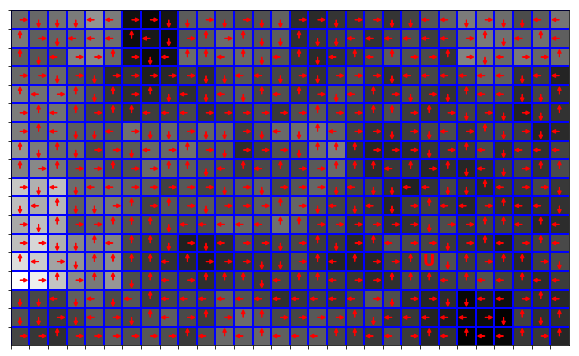

Floor  30


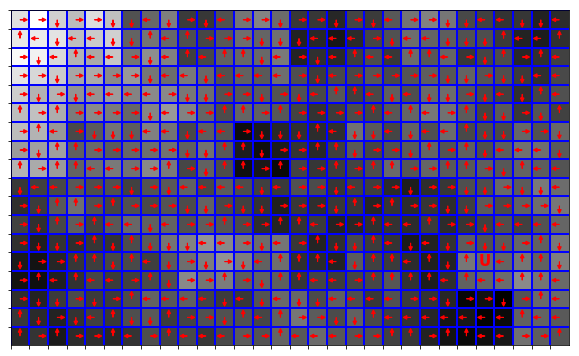

Floor  31


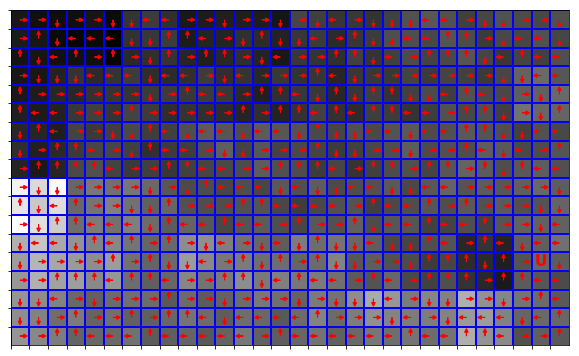

Floor  32


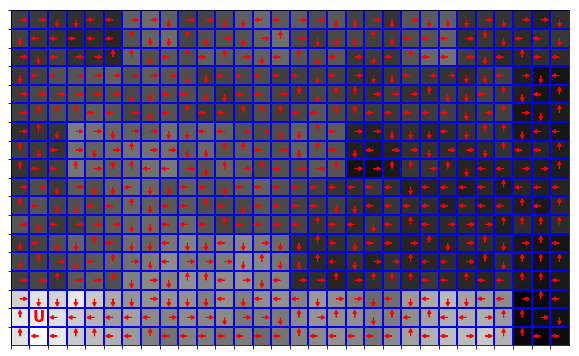

Floor  33


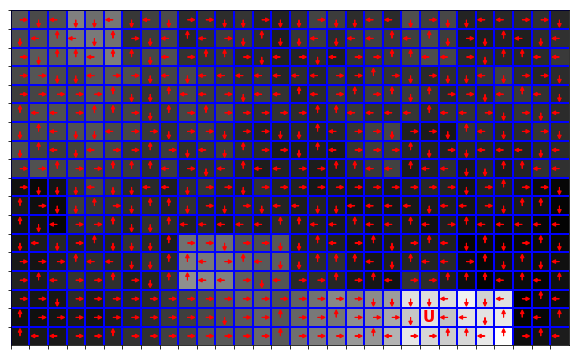

Floor  34


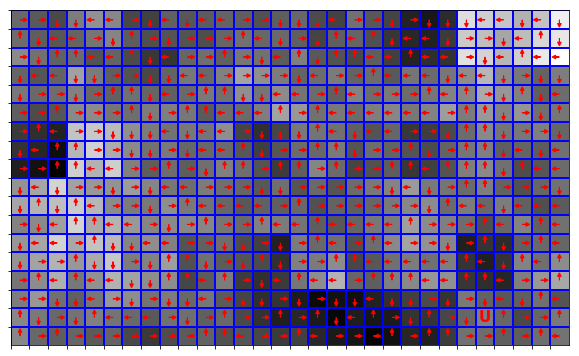

Floor  35


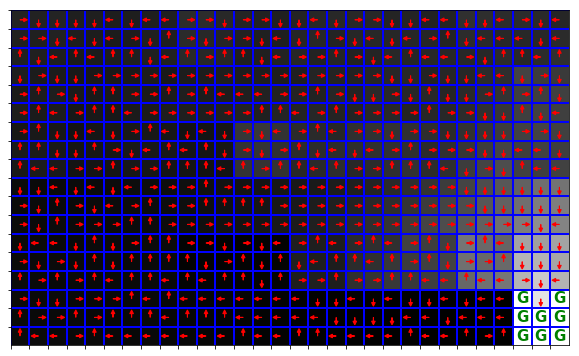

time: 17.4 s


In [39]:
S_reshaped = np.reshape(S, (35,540))
V_reshaped = np.reshape(V, (35,540))
policy_reshaped = np.reshape(policy, (35,540))

for i in range(35):
    print('Floor ',i+1)
    draw_policy(S_reshaped[i], V_reshaped[i], policy_reshaped[i], (18,30), 15)

## Comparando os Algoritmos
### Variando gamma

In [40]:
S, A, P = loadFromDataPath('Dados_Relatorio1/Ambiente1/')

gammas = []
vi_deltaV = []
vi_updates = []
pi_deltaV = []
pi_updates = []
ps_deltaV = []
ps_updates = []
lr_deltaV = []
lr_updates = []
ep = 1e-3
for gamma in [0.1,0.2,0.3,0.4, 0.5, 0.6, 0.7, 0.8, 0.9]:
    
    gammas.append(gamma)
    policy, V, steps, updates = value_iteration(S, A, P, 100000, gamma, ep)
    vi_deltaV.append(abs(min(V)))
    vi_updates.append(updates)
    
    policy, V, steps, updates = policy_iteration(S, A, P, 100000, gamma, ep)
    pi_deltaV.append(abs(min(V)))
    pi_updates.append(updates)
    
    policy, V, steps, updates = prioritized_sweeping(S, A, P, gamma, ep)
    ps_deltaV.append(abs(min(V)))
    ps_updates.append(updates)
    
    policy, V, updates = lrtdp(0, S, A, P, gamma, ep)
    lr_deltaV.append(abs(min(V)))
    lr_updates.append(updates)
    

steps 3
updates 4824
steps 12
q_updates 15678
ev_updates 3149
updates 18827
steps 2392
updates 22653
updates 132
steps 5
updates 7236
steps 17
q_updates 21708
ev_updates 4407
updates 26115
steps 2894
updates 27186
updates 144
steps 6
updates 8442
steps 19
q_updates 24120
ev_updates 4932
updates 29052
steps 3434
updates 32051
updates 132
steps 8
updates 10854
steps 20
q_updates 25326
ev_updates 5004
updates 30330
steps 4028
updates 37455
updates 142
steps 10
updates 13266
steps 21
q_updates 26532
ev_updates 5326
updates 31858
steps 4351
updates 40280
updates 132
steps 14
updates 18090
steps 21
q_updates 26532
ev_updates 5335
updates 31867
steps 5149
updates 47516
updates 132
steps 20
updates 25326
steps 19
q_updates 24120
ev_updates 4869
updates 28989
steps 7020
updates 64590
updates 124
steps 26
updates 32562
steps 18
q_updates 22914
ev_updates 4640
updates 27554
steps 9755
updates 89833
updates 124
steps 28
updates 34974
steps 18
q_updates 22914
ev_updates 4568
updates 27482
steps 123

### Número de atualizações do operador de Bellman 

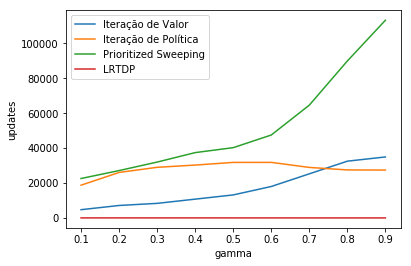

time: 154 ms


In [41]:
import matplotlib.pyplot as plt

plt.ylabel('updates')
plt.xlabel('gamma')
line_vi, = plt.plot(gammas,vi_updates)
line_pi, = plt.plot(gammas,pi_updates)
line_ps, = plt.plot(gammas,ps_updates)
line_lr, = plt.plot(gammas,lr_updates)
plt.legend([line_vi, line_pi,line_ps,line_lr], ['Iteração de Valor', 'Iteração de Política', 'Prioritized Sweeping','LRTDP'])

plt.show()

### Diferença absoluta entre os Valores

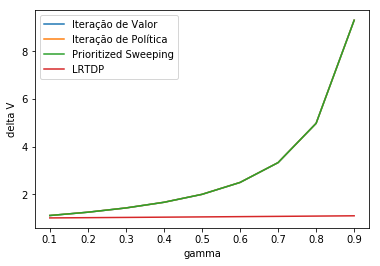

time: 189 ms


In [42]:
plt.ylabel('delta V')
plt.xlabel('gamma')
line_vi, = plt.plot(gammas,vi_deltaV)
line_pi, = plt.plot(gammas,pi_deltaV)
line_ps, = plt.plot(gammas,ps_deltaV)
line_lr, = plt.plot(gammas,lr_deltaV)
plt.legend([line_vi, line_pi,line_ps,line_lr], ['Iteração de Valor', 'Iteração de Política', 'Prioritized Sweeping','LRTDP'])

plt.show()

### Variando epsilon

steps 22
updates 27738
steps 26
updates 32562
steps 28
updates 34974
steps 29
updates 36180
steps 31
updates 38592
steps 32
updates 39798
steps 33
updates 41004
steps 34
updates 42210


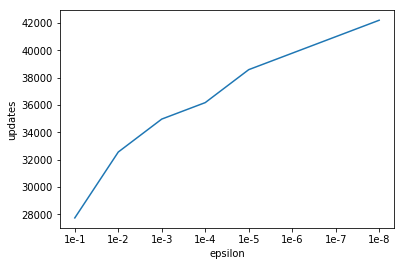

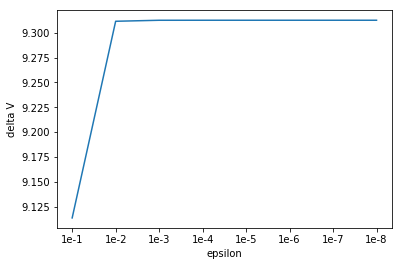

time: 721 ms


In [43]:
result = []
epsilons = ['1e-1','1e-2','1e-3','1e-4','1e-5','1e-6','1e-7','1e-8']
maxV = []
all_updates = []
for ep in [1e-1,1e-2,1e-3,1e-4,1e-5,1e-6,1e-7,1e-8]:
    policy, V, steps, updates = value_iteration(S, A, P, 100, 0.9, ep)
    result.append([ep, policy, V, steps, updates])
    maxV.append(abs(min(V)))
    all_updates.append(updates)
    
import matplotlib.pyplot as plt
plt.plot(epsilons,all_updates)
plt.ylabel('updates')
plt.xlabel('epsilon')
plt.show()

plt.plot(epsilons, maxV)
plt.ylabel('delta V')
plt.xlabel('epsilon')
plt.show()